### Load the dependencies

In [75]:
!pip install brainweb-dl nibabel numpy matplotlib

Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 23.3.2 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [76]:
# === Core Libraries ===
import numpy as np
import matplotlib.pyplot as plt

# === Medical Imaging ===
import nibabel as nib
from nibabel import load

# === Scipy - Image Processing & Math ===
from scipy.ndimage import (
    binary_erosion,
    binary_dilation,
    binary_fill_holes,
    distance_transform_edt,
    gaussian_filter,
    laplace
)
from scipy.stats import entropy

# === Skimage - Image Processing ===
from skimage import filters, morphology
from skimage.filters import threshold_otsu
from skimage.exposure import rescale_intensity
from skimage.segmentation import find_boundaries
from skimage.transform import resize

# === Machine Learning ===
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

# === Wavelet Transform ===
import pywt


### Loading and Visualizing a NIfTI Brain Image Slice

This cell loads a 3D brain MRI volume from a NIfTI (`.mnc.gz`) file using `nibabel`, converts it to a NumPy array, and displays a central axial slice. It also prints the shape and data type of the image volume for verification.


Data shape: (181, 217, 181)
Data type: float64


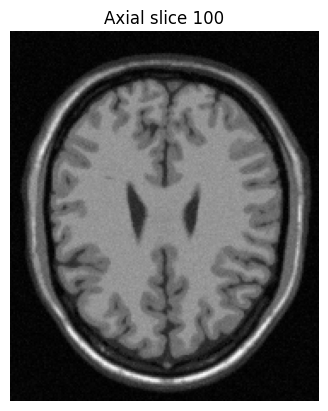

In [77]:
nifti_path = r't1_icbm_normal_1mm_pn3_rf0.mnc.gz'
img = nib.load(nifti_path)

# Get the image data as a NumPy array
data = img.get_fdata()

# Show basic info
print(f"Data shape: {data.shape}")
print(f"Data type: {data.dtype}")

# Display a central axial slice
slice_index = 100  
plt.imshow(data[slice_index, :, ], cmap='gray')
plt.title(f'Axial slice {slice_index}')
plt.axis('off')
plt.show()


Data shape: (181, 217, 181)
Data type: float64


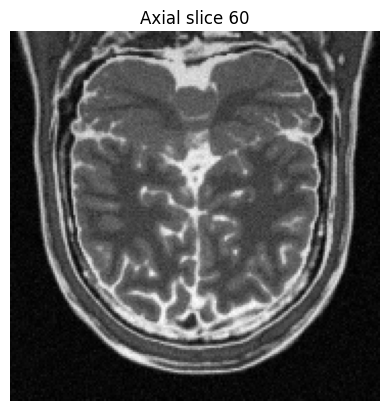

In [78]:
nifti_path = r't2_icbm_normal_1mm_pn3_rf20.mnc.gz'
img = nib.load(nifti_path)

# Get the image data as a NumPy array
data = img.get_fdata()

# Show basic info
print(f"Data shape: {data.shape}")
print(f"Data type: {data.dtype}")

# Display a central axial slice
slice_index = 60 
plt.imshow(data[ :, slice_index,:], cmap='gray')
plt.title(f'Axial slice {slice_index}')
plt.axis('off')
plt.show()


**FSL-BET** stripping of MRI volume and visualizing the slices  
https://web.mit.edu/fsl_v5.0.10/fsl/doc/wiki/BET(2f)UserGuide.html

Data shape: (181, 217, 181)
Data type: float64


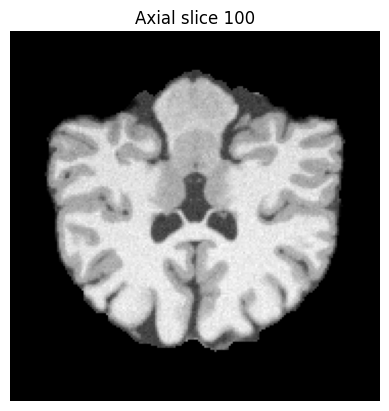

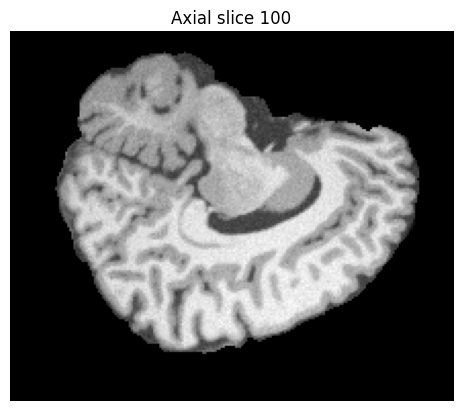

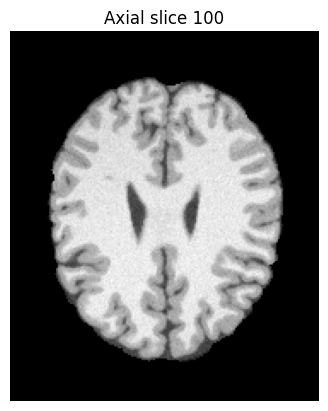

In [79]:
nifti_path = r'C:\Users\anime\Downloads\SCIC_code\t1_brain.nii.gz' # Enter the path of stripped volume
img = nib.load(nifti_path)

# Get the image data as a NumPy array
data = img.get_fdata()

# Show basic info
print(f"Data shape: {data.shape}")
print(f"Data type: {data.dtype}")

# Display a central axial slice
slice_index = 100
plt.imshow(data[:,slice_index,: ], cmap='gray')
plt.title(f'Axial slice {slice_index}')
plt.axis('off')
plt.show()

slice_index = 100
plt.imshow(data[:,:,slice_index ], cmap='gray')
plt.title(f'Axial slice {slice_index}')
plt.axis('off')
plt.show()

slice_index = 100
plt.imshow(data[slice_index,:,:], cmap='gray')
plt.title(f'Axial slice {slice_index}')
plt.axis('off')
plt.show()




### Mehtod 1 : Wavelet Based Iterative MVP and Bias Field Estimation

In [80]:
def load_mri_slice(nifti_file, slice_index=None):
    img = nib.load(nifti_file)
    data = img.get_fdata()
    if slice_index is None:
        slice_index = 100
    slice_2d = data[slice_index, :, :]
    slice_2d = rescale_intensity(slice_2d, in_range='image', out_range=(0, 1))
    return slice_2d, data

def dwt_approx(image, wavelet='bior4.4', level=1):
    coeffs = pywt.wavedec2(image, wavelet=wavelet, level=level)
    return coeffs

def iterative_mvp(image, wavelet='bior4.4', level=1, max_iter=100, tol=0.01):
    estimate = image.copy()
    prev_estimate = None

    for i in range(max_iter):
        # 1. Wavelet decomposition
        coeffs = pywt.wavedec2(estimate, wavelet=wavelet, level=level)
        approx = coeffs[0]

        # 2. Zero out details
        detail_coeffs = [tuple(np.zeros_like(d) for d in details) for details in coeffs[1:]]
        coeffs_zeroed = [approx] + detail_coeffs

        # 3. Reconstruct approx image only
        approx_up = pywt.waverec2(coeffs_zeroed, wavelet=wavelet)

        # 4. Resize and normalize
        approx_up = resize(approx_up, image.shape, preserve_range=True, mode='reflect', anti_aliasing=True)
        approx_up = rescale_intensity(approx_up, in_range='image', out_range=(0, 1))
        # approx_up = resize(approx_up, image.shape, preserve_range=True, mode='reflect', anti_aliasing=True)

        # Normalize by energy
        energy = np.linalg.norm(approx_up)
        if energy > 1e-6:
            approx_up = approx_up / energy

        # Optional: rescale to [0, 1] for consistency with input
        approx_up = rescale_intensity(approx_up, in_range='image', out_range=(0, 1))
        # 5. MVP with original image
        mvp = np.maximum(approx_up, image)

        # 6. Check convergence
        if prev_estimate is not None:
            diff = np.linalg.norm(mvp - prev_estimate) / np.linalg.norm(prev_estimate)
            if diff < tol:
                print(f"Converged at iteration {i+1} with diff {diff:.4f}")
                break

        prev_estimate = estimate
        estimate = mvp

    return estimate


def normalize_image(original, bias_field):
    bias_field = np.clip(bias_field, 1e-3, None)
    return original / bias_field

def compute_inhomogeneity_index(image, coil_map):
    img = rescale_intensity(image, in_range='image', out_range=(0, 1)).flatten().reshape(-1, 1)
    gmm = GaussianMixture(n_components=3, random_state=42).fit(img)
    means = gmm.means_.flatten()
    variances = gmm.covariances_.flatten()
    contrast = np.max(means) - np.min(means)
    variance = np.sum(variances)
    smoothness = np.sum(np.abs(laplace(coil_map)))
    return (variance / contrast) * smoothness

def correct_bias_field(image, wavelet='bior4.4', max_levels=7):
    best_index = None
    best_score = np.inf
    best_corrected = None
    best_coil_map = None
    for level in range(1, max_levels + 1):
        coil_map = iterative_mvp(image, wavelet=wavelet, level=level)
        corrected = normalize_image(image, coil_map)
        score = compute_inhomogeneity_index(corrected, coil_map)
        print(f"Level {level}: Inhomogeneity index = {score:.4f}")
        if score < best_score:
            best_score = score
            best_index = level
            best_corrected = corrected
            best_coil_map = coil_map
    return best_corrected, best_index, best_coil_map

def plot_correction_with_bias(original, corrected, bias_field, level, mask=None):
    plt.figure(figsize=(24, 6))

    
    plt.subplot(1, 4, 1)
    plt.title("Original Slice")
    plt.imshow(original, cmap='gray')
    plt.axis('off')

   
    plt.subplot(1, 4, 2)
    plt.title(f"Corrected Image (Level {level})")
    if mask is not None:
        corrected_display = np.copy(corrected)
        corrected_display[~mask] = 0  
        plt.imshow(corrected_display, cmap='gray')
    else:
        plt.imshow(corrected, cmap='gray')
    plt.axis('off')

    
    plt.subplot(1, 4, 3)
    plt.title(f"Bias Field (Grayscale)")
    im3 = plt.imshow(bias_field, cmap='gray')
    plt.colorbar(im3, shrink=0.7)
    plt.axis('off')

    
    plt.subplot(1, 4, 4)
    plt.title(f"Bias Field (Heatmap)")
    im4 = plt.imshow(bias_field, cmap='jet')
    plt.colorbar(im4, shrink=0.7)
    plt.axis('off')

    plt.tight_layout()
    plt.show()



### Testing Method 1 on a T1-weighted brainweb data (20 % non-unifromity) 

Converged at iteration 56 with diff 0.0100
Level 1: Inhomogeneity index = 155.5128
Converged at iteration 48 with diff 0.0088
Level 2: Inhomogeneity index = 126.1230
Converged at iteration 37 with diff 0.0100
Level 3: Inhomogeneity index = 27.2569
Converged at iteration 50 with diff 0.0094
Level 4: Inhomogeneity index = 30.2664


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 5 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Converged at iteration 44 with diff 0.0099
Level 5: Inhomogeneity index = 13.1983


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 6 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Converged at iteration 22 with diff 0.0097
Level 6: Inhomogeneity index = 31.5379


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 7 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Converged at iteration 12 with diff 0.0084
Level 7: Inhomogeneity index = 63.3482


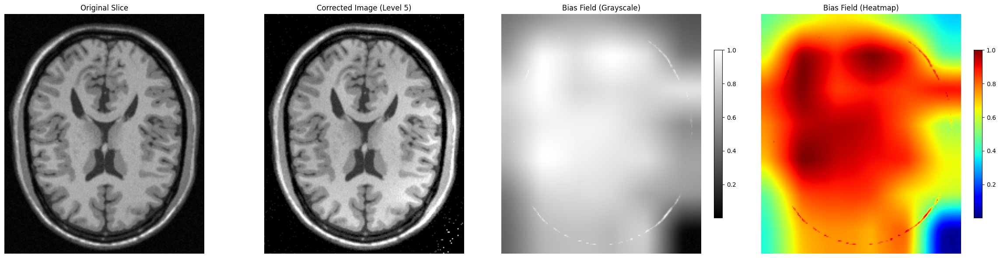

In [81]:
if __name__ == "__main__":
    nifti_path = r"C:\Users\anime\Downloads\SCIC_code\t1_icbm_normal_1mm_pn3_rf20.mnc"  
    slice_index = 85
    mri_slice, data = load_mri_slice(nifti_path, slice_index=slice_index)
    mask = mri_slice > 0.05  

    corrected_image, best_level, bias_field = correct_bias_field(mri_slice, wavelet='bior4.4')
    plot_correction_with_bias(mri_slice, corrected_image, bias_field, best_level, mask=mask)

### Histogram of the Bias Field Estimated by Method 1 on T1-weighted data

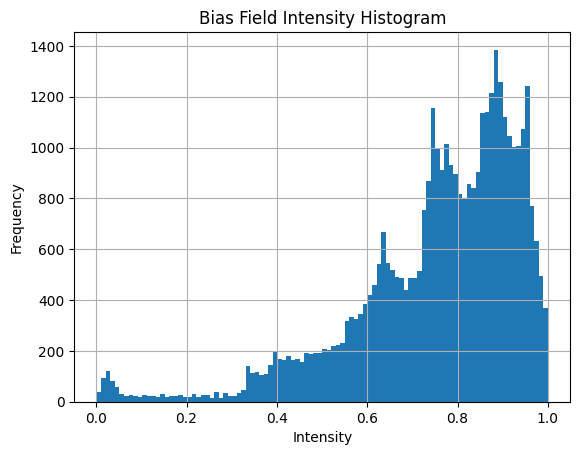

In [82]:
plt.hist(bias_field.ravel(), bins=100)
plt.title("Bias Field Intensity Histogram")
plt.xlabel("Intensity")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()


### Method 2 : Wavelet Based Approximation + Iterative MVP using FSLBET for extracting Brain
Testing on T1-Weighted BrainWeb Data (20% Non-Uniformity, Skull-Stripped with FSL-BET)

Converged at iteration 44 with diff 0.0100
Level 1: Inhomogeneity index = 24.1922
Converged at iteration 48 with diff 0.0095
Level 2: Inhomogeneity index = 19.6806
Converged at iteration 15 with diff 0.0090
Level 3: Inhomogeneity index = 32.2367
Converged at iteration 63 with diff 0.0098
Level 4: Inhomogeneity index = 9.1081


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 5 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Converged at iteration 33 with diff 0.0098
Level 5: Inhomogeneity index = 28.0013


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 6 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Converged at iteration 22 with diff 0.0100
Level 6: Inhomogeneity index = 33.8063


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 7 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Converged at iteration 23 with diff 0.0098
Level 7: Inhomogeneity index = 44.7159


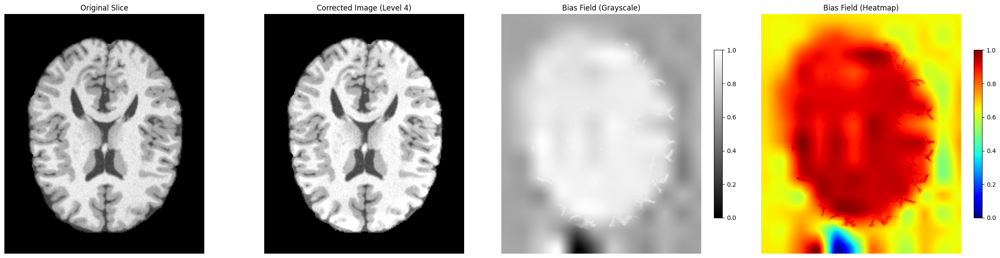

In [83]:
if __name__ == "__main__":
    nifti_path = r"C:\Users\anime\Downloads\SCIC_code\t1_brain.nii.gz"  
    slice_index = 85
    mri_slice, data = load_mri_slice(nifti_path, slice_index=slice_index)
    mask = mri_slice > 0.05  # Brain mask

    # Pass mask to bias correction function
    corrected_image, best_level, bias_field = correct_bias_field(mri_slice, wavelet='bior4.4')

    # Pass mask to plotting (optional: set mask=mask instead of None)
    plot_correction_with_bias(mri_slice, corrected_image, bias_field, best_level, mask=mask)


### Histogram of the Bias Field Estimated by Method 2 on T1-weighted data (Skull-stripped)

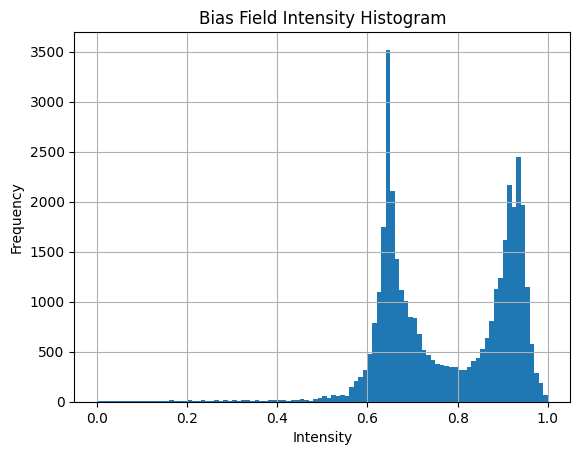

In [84]:
plt.hist(bias_field.ravel(), bins=100)
plt.title("Bias Field Intensity Histogram")
plt.xlabel("Intensity")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()


### Plotting Bias Field Energy Across Wavelet Decomposition Levels

Converged at iteration 43 with diff 0.0098
Level 1: Energy = 9508.3253
Converged at iteration 22 with diff 0.0093
Level 2: Energy = 7446.5306
Converged at iteration 36 with diff 0.0095
Level 3: Energy = 21153.5905
Converged at iteration 44 with diff 0.0099
Level 4: Energy = 25056.1623


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 5 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Converged at iteration 35 with diff 0.0097
Level 5: Energy = 22648.1215


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 6 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Converged at iteration 28 with diff 0.0100
Level 6: Energy = 13689.3532


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 7 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Converged at iteration 12 with diff 0.0083
Level 7: Energy = 16067.1109


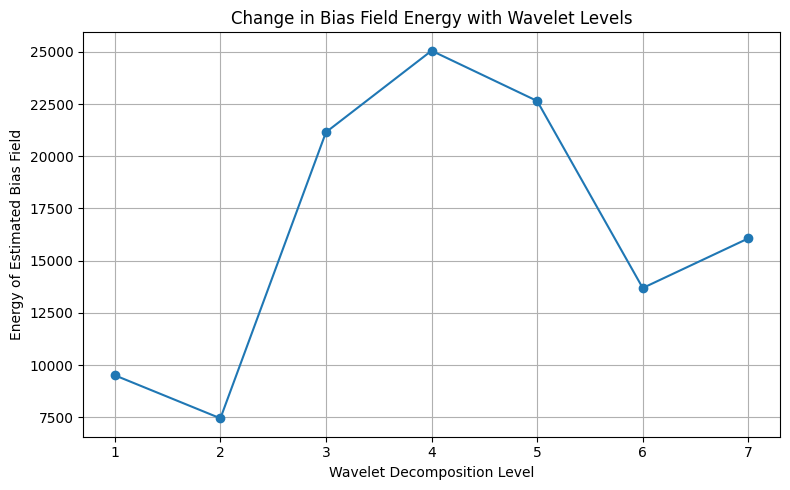

In [85]:
def plot_energy_vs_level(image, wavelet='bior4.4', max_levels=7):
    energies = []

    for level in range(1, max_levels + 1):
        coil_map = iterative_mvp(image, wavelet=wavelet, level=level)
        energy = np.sum(coil_map ** 2)
        energies.append(energy)
        print(f"Level {level}: Energy = {energy:.4f}")

    # Plotting
    plt.figure(figsize=(8, 5))
    plt.plot(range(1, max_levels + 1), energies, marker='o', linestyle='-')
    plt.title("Change in Bias Field Energy with Wavelet Levels")
    plt.xlabel("Wavelet Decomposition Level")
    plt.ylabel("Energy of Estimated Bias Field")
    plt.grid(True)
    plt.tight_layout()
    plt.show()
image, _ = load_mri_slice(r"C:\Users\anime\Downloads\SCIC_code\t1_icbm_normal_1mm_pn3_rf20.nii.gz")
plot_energy_vs_level(image)


### Analyzing Wavelet Approximation Energy per Coefficient Across Levels

Level 1: Wavelet Approx Energy per coeff = 0.5393
Level 2: Wavelet Approx Energy per coeff = 1.7897
Level 3: Wavelet Approx Energy per coeff = 5.2131
Level 4: Wavelet Approx Energy per coeff = 12.2624
Level 5: Wavelet Approx Energy per coeff = 23.5217
Level 6: Wavelet Approx Energy per coeff = 35.9987
Level 7: Wavelet Approx Energy per coeff = 45.5006
Level 8: Wavelet Approx Energy per coeff = 53.2088


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 5 is too high: all coefficients will experience boundary effects.
  warnings.warn(
C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 6 is too high: all coefficients will experience boundary effects.
  warnings.warn(
C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 7 is too high: all coefficients will experience boundary effects.
  warnings.warn(
C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 8 is too high: all coefficients will experience boundary effects.
  warnings.warn(


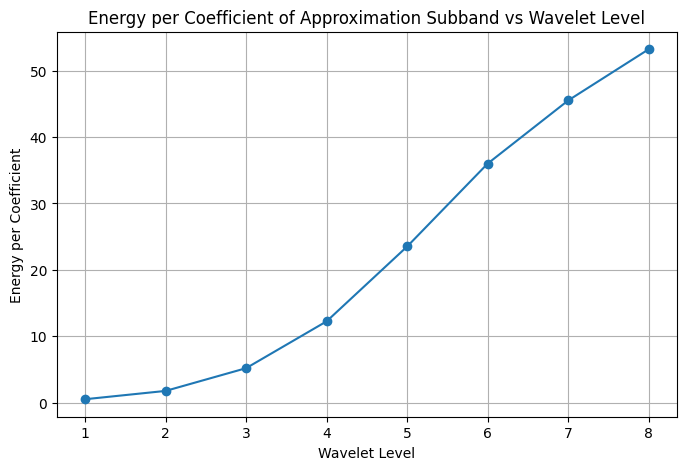

In [86]:
def plot_wavelet_approx_energy(image, wavelet='bior4.4', max_levels=8):
    energies = []
    for level in range(1, max_levels + 1):
        coeffs = pywt.wavedec2(image, wavelet=wavelet, level=level)
        approx = coeffs[0]
        energy = np.sum(approx ** 2) / approx.size  # true normalized energy
        energies.append(energy)
        print(f"Level {level}: Wavelet Approx Energy per coeff = {energy:.4f}")

    plt.figure(figsize=(8, 5))
    plt.plot(range(1, max_levels + 1), energies, marker='o')
    plt.title("Energy per Coefficient of Approximation Subband vs Wavelet Level")
    plt.xlabel("Wavelet Level")
    plt.ylabel("Energy per Coefficient")
    plt.grid(True)
    plt.show()

image, _ = load_mri_slice(r"C:\Users\anime\Downloads\SCIC_code\t1_icbm_normal_1mm_pn3_rf20.nii.gz")
plot_wavelet_approx_energy(image)

### Method 3 : Energy-Based Thresholding with Iterative MVP

In [87]:
def load_mri_slice(nifti_file, slice_index=None):
    img = nib.load(nifti_file)
    data = img.get_fdata()
    if slice_index is None:
        slice_index = data.shape[0] // 2
    slice_2d = data[slice_index, :, :]
    slice_2d = rescale_intensity(slice_2d, in_range='image', out_range=(0, 1))
    return slice_2d, data

def dwt_approx(image, wavelet='bior4.4', level=1):
    coeffs = pywt.wavedec2(image, wavelet=wavelet, level=level)
    return coeffs

def calculate_wavelet_energy(coeffs):
    energy = 0
    for level_coeffs in coeffs[1:]:  # Exclude approximation coefficients
        for d in level_coeffs:
            energy += np.sum(d**2)
    return energy / (coeffs[0].size + 1e-6)  # Prevent division by zero

def iterative_mvp(image, wavelet='bior4.4', level=1, 
                 energy_threshold=0.05, max_iter=50):
    estimate = image.copy()
    initial_coeffs = dwt_approx(image, wavelet, level)
    initial_energy = calculate_wavelet_energy(initial_coeffs)
    
    for i in range(max_iter):
        coeffs = dwt_approx(estimate, wavelet, level)
        current_energy = calculate_wavelet_energy(coeffs)
        
        # Energy-based stopping criterion (Lin et al. Sec 2.2)
        if current_energy / initial_energy < energy_threshold:
            break
            
        # Original MVP processing (Lin et al. Fig 1)
        approx = coeffs[0]
        detail_coeffs = [tuple(np.zeros_like(d) for d in details) 
                        for details in coeffs[1:]]
        coeffs_zeroed = [approx] + detail_coeffs
        approx_up = pywt.waverec2(coeffs_zeroed, wavelet)
        approx_up = resize(approx_up, image.shape, 
                          preserve_range=True, mode='reflect',
                          anti_aliasing=True)
        approx_up = rescale_intensity(approx_up, in_range='image', 
                                     out_range=(0, 1))
        mvp = np.maximum(approx_up, image)
        estimate = mvp
        
    return estimate, initial_energy, current_energy, i+1

def normalize_image(original, bias_field):
    bias_field = np.clip(bias_field, 1e-3, None)
    return original / bias_field

def compute_inhomogeneity_index(image, coil_map):
    img = rescale_intensity(image, in_range='image', out_range=(0, 1))
    img_flat = img.flatten().reshape(-1, 1)
    
    gmm = GaussianMixture(n_components=3, random_state=42).fit(img_flat)
    means = gmm.means_.flatten()
    variances = gmm.covariances_.flatten()
    
    contrast = np.max(means) - np.min(means)
    variance = np.sum(variances)
    
    smoothness = np.sum(np.abs(laplace(coil_map)))
    
    return (variance / contrast) * smoothness

def correct_bias_field(image, wavelet='bior4.4', max_levels=7, 
                      base_energy_threshold=0.05):
    best_index = None
    best_score = np.inf
    best_corrected = None
    best_coil_map = None

    for level in range(1, max_levels + 1):
        energy_thresh = base_energy_threshold * (2 ** (level - 1))
        
        coil_map, init_e, final_e, iters = iterative_mvp(
            image, wavelet=wavelet, level=level, 
            energy_threshold=energy_thresh
        )
        corrected = normalize_image(image, coil_map)
        inhomogeneity = compute_inhomogeneity_index(corrected, coil_map)
        energy_ratio = final_e / init_e

        print(f"Level {level}: "
              f"Iterations={iters}, "
              f"Inhomogeneity={inhomogeneity:.4f}, "
              f"Energy Ratio={energy_ratio:.2%}")

        if inhomogeneity < best_score:
            best_score = inhomogeneity
            best_index = level
            best_corrected = corrected
            best_coil_map = coil_map

    return best_corrected, best_index, best_coil_map

def plot_correction_with_bias(original, corrected, bias_field, level, mask=None):
    plt.figure(figsize=(24, 6))

    plt.subplot(1, 4, 1)
    plt.title("Original Slice")
    plt.imshow(original, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 4, 2)
    plt.title(f"Corrected (Level {level})")
    plt.imshow(corrected, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 4, 3)
    plt.title("Bias Field (Grayscale)")
    plt.imshow(bias_field, cmap='gray')
    plt.colorbar(shrink=0.7)
    plt.axis('off')

    plt.subplot(1, 4, 4)
    plt.title("Bias Field (Heatmap)")
    plt.imshow(bias_field, cmap='jet')
    plt.colorbar(shrink=0.7)
    plt.axis('off')

    plt.tight_layout()
    plt.show()



### Testing Method 3 on T1-weighted data (20% non-uniformity)

Level 1: Iterations=50, Inhomogeneity=78.2704, Energy Ratio=25.93%
Level 2: Iterations=50, Inhomogeneity=160.6639, Energy Ratio=53.44%
Level 3: Iterations=16, Inhomogeneity=27.7104, Energy Ratio=5.79%
Level 4: Iterations=3, Inhomogeneity=22.7749, Energy Ratio=11.56%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 5 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 5: Iterations=2, Inhomogeneity=18.5722, Energy Ratio=21.14%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 6 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 6: Iterations=2, Inhomogeneity=26.4867, Energy Ratio=28.63%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 7 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 7: Iterations=3, Inhomogeneity=55.3380, Energy Ratio=77.15%
Level 8: Iterations=1, Inhomogeneity=185.4709, Energy Ratio=100.00%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 8 is too high: all coefficients will experience boundary effects.
  warnings.warn(
C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 9 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 9: Iterations=1, Inhomogeneity=185.4709, Energy Ratio=100.00%
Level 10: Iterations=1, Inhomogeneity=185.4709, Energy Ratio=100.00%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 10 is too high: all coefficients will experience boundary effects.
  warnings.warn(


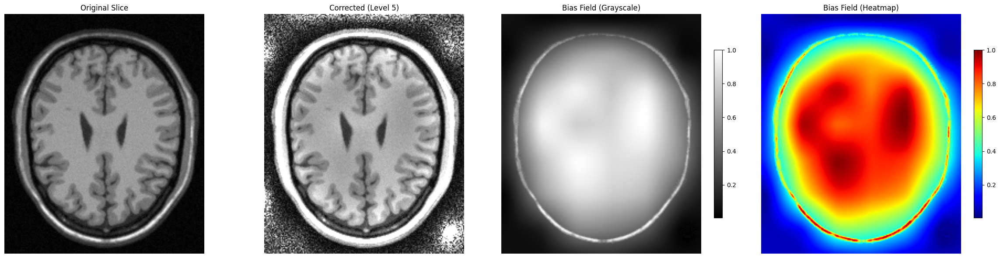

In [88]:
if __name__ == "__main__":
    nifti_path = r"C:\Users\anime\Downloads\SCIC_code\t1_icbm_normal_1mm_pn3_rf20.nii.gz"
    slice_idx = 100  # Adjust based on your dataset
    
    original_slice, _ = load_mri_slice(nifti_path, slice_index=slice_idx)
    corrected_img, best_level, bias_field = correct_bias_field(
        original_slice, 
        wavelet='bior4.4',
        max_levels=10,
        base_energy_threshold=0.015
    )
    
    plot_correction_with_bias(original_slice, corrected_img, 
                             bias_field, best_level)


### Visulaising the results of Method 3 with a KMeans mask derived from the original slice

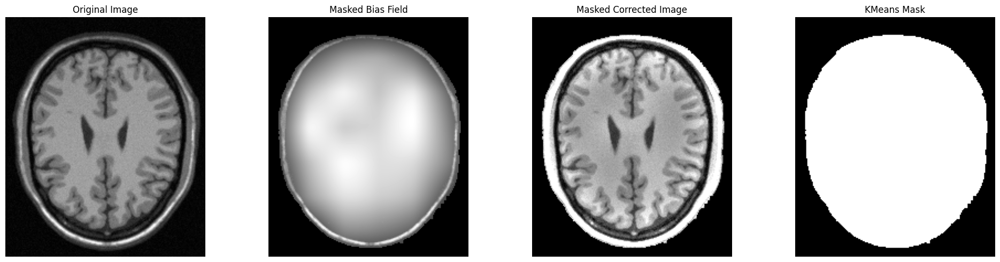

In [89]:
import matplotlib.pyplot as plt
from skimage.exposure import rescale_intensity
from scipy.ndimage import binary_fill_holes, binary_dilation

from sklearn.cluster import KMeans
import numpy as np

def create_kmeans_mask(image, n_clusters=2):
    # Flatten image for clustering
    flat = image.reshape(-1, 1)
    
    # Apply KMeans
    kmeans = KMeans(n_clusters=n_clusters, n_init='auto', random_state=42)
    kmeans.fit(flat)
    clustered = kmeans.labels_.reshape(image.shape)
    
    # Find cluster with highest mean intensity (assumed to be foreground)
    cluster_means = [np.mean(image[clustered == i]) for i in range(n_clusters)]
    brain_cluster = np.argmax(cluster_means)
    
    # Create binary mask
    mask = (clustered == brain_cluster)
    mask = binary_fill_holes(mask)
    mask = binary_dilation(mask, structure=np.ones((3, 3)))
  # Optional: smooth boundary
    return mask

def show_bias_correction_results(original, bias_field):
    # Step 1: Clip bias to avoid division explosion
    safe_bias = np.clip(bias_field, 1e-4, None)
    
    # Step 2: Correct the image
    corrected = original / safe_bias
    corrected_clipped = np.clip(corrected, 0, 2)
    corrected_rescaled = rescale_intensity(corrected_clipped, in_range='image', out_range=(0, 1))
    
    # Step 3: Create KMeans-based mask
    mask = create_kmeans_mask(original, n_clusters=2)

    # Step 4: Apply mask to bias and corrected image
    masked_bias = bias_field * mask
    masked_corrected = corrected_rescaled * mask

    # Step 5: Plotting
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    
    axes[0].imshow(original, cmap='gray')
    axes[0].set_title("Original Image")
    axes[0].axis('off')
    
    axes[1].imshow(masked_bias, cmap='gray')
    axes[1].set_title("Masked Bias Field")
    axes[1].axis('off')
    
    axes[2].imshow(masked_corrected, cmap='gray')
    axes[2].set_title("Masked Corrected Image")
    axes[2].axis('off')
    
    axes[3].imshow(mask, cmap='gray')
    axes[3].set_title("KMeans Mask")
    axes[3].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return masked_corrected

masked_corrected= show_bias_correction_results(original_slice, bias_field)




### Visulaising the results of Method 3 with an Otsu mask derived from the original slice

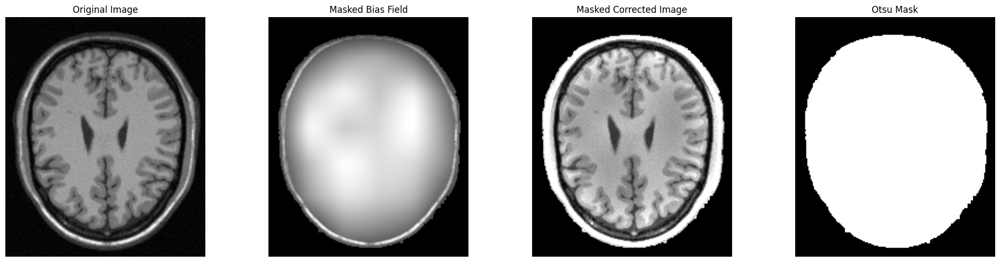

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [90]:
import matplotlib.pyplot as plt
from skimage.exposure import rescale_intensity
from skimage.filters import threshold_otsu
from scipy.ndimage import binary_fill_holes, binary_dilation
import numpy as np

def create_otsu_mask(image):
    # Step 1: Compute Otsu threshold
    thresh = threshold_otsu(image)
    
    # Step 2: Create mask (foreground = pixels above threshold)
    mask = image > thresh
    
    # Step 3: Fill holes and smooth edges
    mask = binary_fill_holes(mask)
    mask = binary_dilation(mask, structure=np.ones((3, 3)))
    return mask

def show_bias_correction_results(original, bias_field):
    # Step 1: Clip bias to avoid division explosion
    safe_bias = np.clip(bias_field, 1e-4, None)
    
    # Step 2: Correct the image
    corrected = original / safe_bias
    corrected_clipped = np.clip(corrected, 0, 2)
    corrected_rescaled = rescale_intensity(corrected_clipped, in_range='image', out_range=(0, 1))
    
    # Step 3: Create Otsu-based mask
    mask = create_otsu_mask(original)

    # Step 4: Apply mask to bias and corrected image
    masked_bias = bias_field * mask
    masked_corrected = corrected_rescaled * mask

    # Step 5: Plotting
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    
    axes[0].imshow(original, cmap='gray')
    axes[0].set_title("Original Image")
    axes[0].axis('off')
    
    axes[1].imshow(masked_bias, cmap='gray')
    axes[1].set_title("Masked Bias Field")
    axes[1].axis('off')
    
    axes[2].imshow(masked_corrected, cmap='gray')
    axes[2].set_title("Masked Corrected Image")
    axes[2].axis('off')
    
    axes[3].imshow(mask, cmap='gray')
    axes[3].set_title("Otsu Mask")
    axes[3].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return masked_corrected
show_bias_correction_results(original_slice, bias_field)


### Histogram of the Bias Field Estimated by Method 3 on T1-weighted data (Skull-stripped)

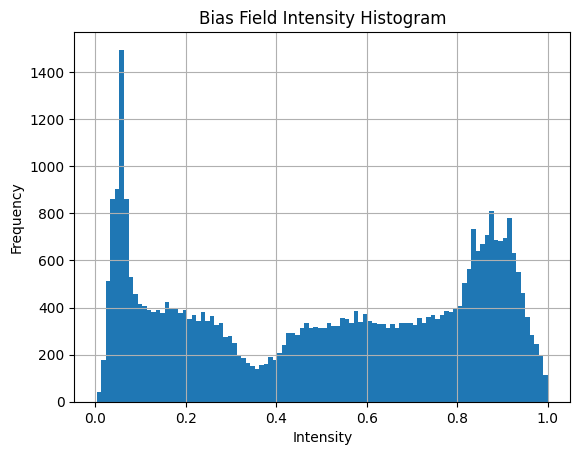

In [91]:
plt.hist(bias_field.ravel(), bins=100)
plt.title("Bias Field Intensity Histogram")
plt.xlabel("Intensity")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()


### Testing Method 3 on T1-weighted Skull-stripped data (20% non-uniformity)

Level 1: Iterations=50, Inhomogeneity=18.6935, Energy Ratio=18.57%
Level 2: Iterations=50, Inhomogeneity=16.8976, Energy Ratio=12.02%
Level 3: Iterations=50, Inhomogeneity=13.9656, Energy Ratio=3.95%
Level 4: Iterations=50, Inhomogeneity=33.3288, Energy Ratio=8.28%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 5 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 5: Iterations=50, Inhomogeneity=24.7857, Energy Ratio=11.19%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 6 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 6: Iterations=50, Inhomogeneity=28.5729, Energy Ratio=12.49%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 7 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 7: Iterations=50, Inhomogeneity=40.4457, Energy Ratio=14.06%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 8 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 8: Iterations=50, Inhomogeneity=67.6861, Energy Ratio=88.05%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 9 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 9: Iterations=50, Inhomogeneity=66.7436, Energy Ratio=1579.35%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 10 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 10: Iterations=50, Inhomogeneity=67.8653, Energy Ratio=4339.00%


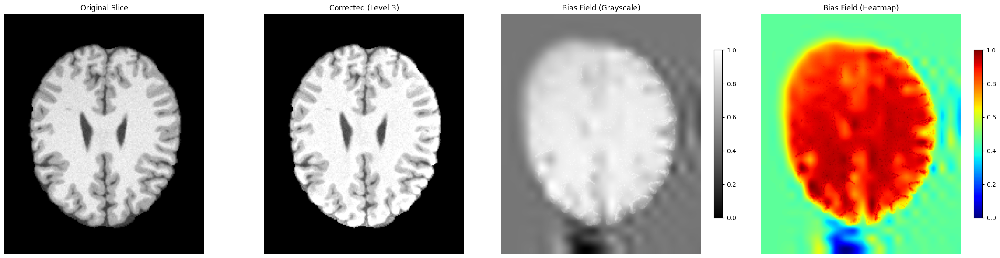

In [92]:
if __name__ == "__main__":
    nifti_path = r"C:\Users\anime\Downloads\SCIC_code\t1_brain.nii.gz"
    slice_idx = 100  # Adjust based on your dataset
    
    original_slice, _ = load_mri_slice(nifti_path, slice_index=slice_idx)
    corrected_img, best_level, bias_field = correct_bias_field(
        original_slice, 
        wavelet='bior4.4',
        max_levels=10,
        base_energy_threshold=0.0015
    )
    
    plot_correction_with_bias(original_slice, corrected_img, 
                             bias_field, best_level)

## Method 4 Extrapolation-Based Bias Field Estimation

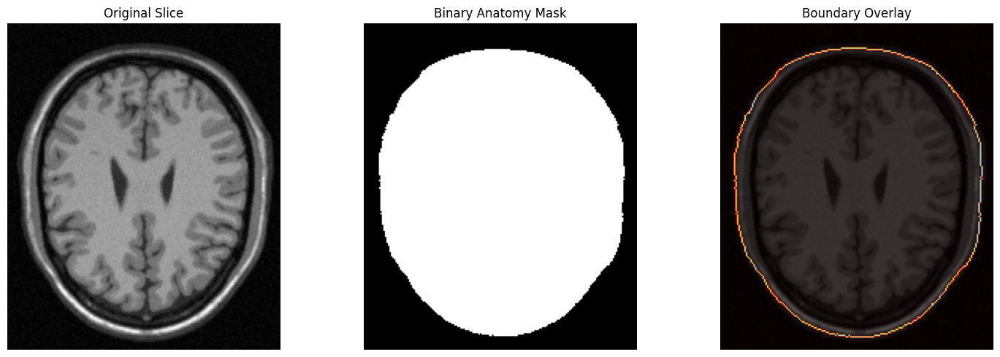

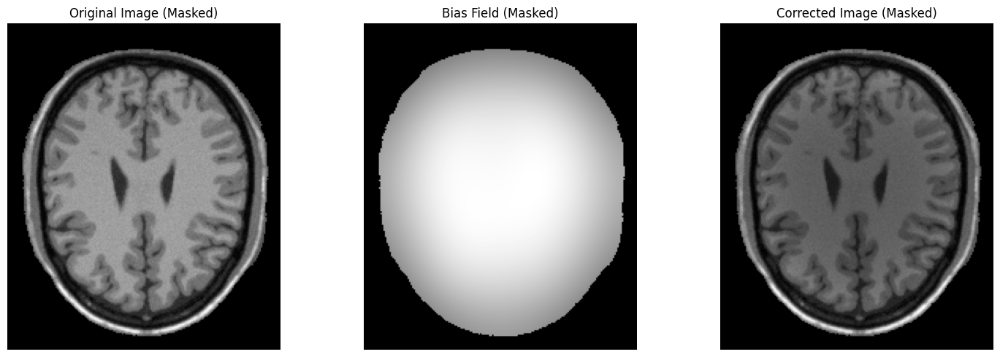

In [93]:
def load_nifti_slice(nifti_path, slice_index=100):
    img = nib.load(nifti_path)
    data = img.get_fdata()
    slice_2d = data[slice_index, :, :]
    slice_2d = rescale_intensity(slice_2d, in_range='image', out_range=(0, 1))
    return slice_2d

def find_anatomy_boundary(image, display=False):
    thresh = filters.threshold_otsu(image)
    mask = image > thresh
    mask = morphology.remove_small_objects(mask, min_size=500)
    mask = morphology.binary_closing(mask, morphology.disk(3))
    mask = binary_fill_holes(mask)
    boundary = find_boundaries(mask, mode='outer')

    if display:
        fig, axs = plt.subplots(1, 3, figsize=(15, 5))
        axs[0].imshow(image, cmap='gray')
        axs[0].set_title("Original Slice")
        axs[1].imshow(mask, cmap='gray')
        axs[1].set_title("Binary Anatomy Mask")
        axs[2].imshow(image, cmap='gray')
        axs[2].imshow(boundary, cmap='hot', alpha=0.7)
        axs[2].set_title("Boundary Overlay")
        for ax in axs:
            ax.axis('off')
        plt.tight_layout()
        plt.show()

    return mask.astype(np.uint8), boundary.astype(np.uint8)

def show_bias_correction_results(original, bias_field, mask):
    # Avoid division by zero or near zero
    safe_bias = np.clip(bias_field, 1e-4, None)
    corrected = original / safe_bias

    # Clip corrected image to reasonable display range
    corrected_clipped = np.clip(corrected, 0, 2)
    corrected_rescaled = rescale_intensity(corrected_clipped, in_range='image', out_range=(0, 1))

    # Apply mask to images (show inside mask only)
    original_masked = np.where(mask, original, 0)
    bias_field_masked = np.where(mask, bias_field, 0)
    corrected_masked = np.where(mask, corrected_rescaled, 0)

    # Plot
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    axes[0].imshow(original_masked, cmap='gray')
    axes[0].set_title("Original Image (Masked)")
    axes[0].axis('off')

    axes[1].imshow(bias_field_masked, cmap='gray')
    axes[1].set_title("Bias Field (Masked)")
    axes[1].axis('off')

    axes[2].imshow(corrected_masked, cmap='gray')
    axes[2].set_title("Corrected Image (Masked)")
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

# === Example usage ===

nifti_file_path = r"C:\Users\anime\Downloads\SCIC_code\t1_icbm_normal_1mm_pn3_rf20.nii.gz"  # Update path
slice_index = 100

# Load the image slice
slice_2d = load_nifti_slice(nifti_file_path, slice_index)

# For testing, generate a fake bias field (replace with your actual bias field)
# Here I simulate smooth low-frequency bias field as example:
from scipy.ndimage import gaussian_filter
bias_field = gaussian_filter(slice_2d, sigma=20)
bias_field = rescale_intensity(bias_field, in_range='image', out_range=(0.5, 1.5))  # example range

# Get mask from Otsu + morphology method
mask, boundary = find_anatomy_boundary(slice_2d, display=True)

# Show masked images with bias correction
show_bias_correction_results(slice_2d, bias_field, mask)


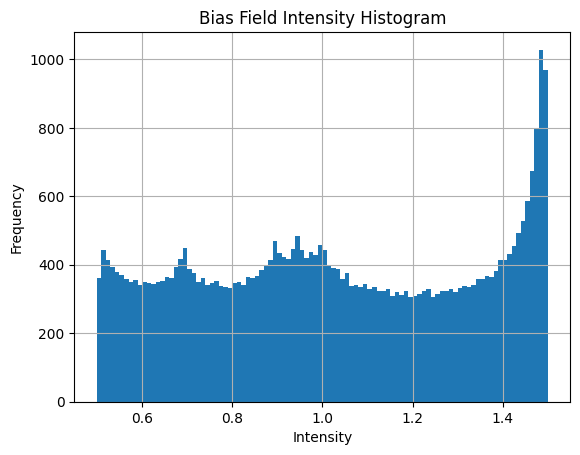

In [94]:
plt.hist(bias_field.ravel(), bins=100)
plt.title("Bias Field Intensity Histogram")
plt.xlabel("Intensity")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()


### Method 4(a) : Mirror Based Extrapolation

In [95]:
def load_mri_slice(nifti_file, slice_index=None):
    """Load MRI slice"""
    img = nib.load(nifti_file)
    data = img.get_fdata()
    if slice_index is None:
        slice_index = data.shape[0] // 2
    slice_2d = data[slice_index, :, :]
    slice_2d = rescale_intensity(slice_2d, in_range='image', out_range=(0, 1))
    return slice_2d, data

def find_image_boundary_cheng(image, noise_threshold_percentile=5):
    """
    Step 1: Find the boundary of the image using thresholding as in Cheng et al.
    """
    # Threshold out noise 
    threshold = np.percentile(image, noise_threshold_percentile)
    binary_mask = image > threshold
    
    # Fill holes and clean up with morphological operations using scipy.ndimage
    filled_mask = binary_fill_holes(binary_mask)
    cleaned_mask = binary_erosion(filled_mask, iterations=2)
    cleaned_mask = binary_dilation(cleaned_mask, iterations=3)
    cleaned_mask = binary_fill_holes(cleaned_mask)
    
    # Find the boundary
    boundary = find_boundaries(cleaned_mask, mode='inner')
    
    return cleaned_mask, boundary

def extrapolate_image_cheng(image, mask):
    """
    Extrapolate image using mirror reflection across anatomical boundaries
    """
    extrapolated = np.copy(image)
    outside_mask = ~mask.astype(bool)
    
    # 1. Detect anatomical boundary using morphological erosion
    structure = np.ones((3,3))  # 8-connected neighborhood
    eroded_mask = binary_erosion(mask, structure=structure)
    boundary = mask ^ eroded_mask  # XOR operation isolates boundary
    
    # 2. Calculate nearest boundary indices for exterior pixels
    _, nearest_boundary_indices = distance_transform_edt(
        ~boundary,  # Invert to treat boundary as foreground
        return_indices=True
    )
    
    # 3. Vectorized mirror coordinate calculation
    x, y = np.where(outside_mask)
    bx = nearest_boundary_indices[0, x, y]
    by = nearest_boundary_indices[1, x, y]
    
    # Mirror formula: p' = 2b - p
    mirror_x = 2*bx - x
    mirror_y = 2*by - y
    
    # 4. Boundary condition handling
    np.clip(mirror_x, 0, image.shape[0]-1, out=mirror_x)
    np.clip(mirror_y, 0, image.shape[1]-1, out=mirror_y)
    
    # 5. Assign mirrored intensities
    extrapolated[x, y] = image[mirror_x.astype(int), mirror_y.astype(int)]
    
    return extrapolated

def calculate_image_entropy(image, bins=256):
    """
    Calculate image entropy for Step 4: optimization criterion
    """
    # Convert to histogram, avoiding zero bins
    hist, _ = np.histogram(image.flatten(), bins=bins, density=True)
    hist = hist[hist > 0]  # Remove zero entries to avoid log(0)
    return entropy(hist, base=2)

def multiresolution_analysis_cheng(image, wavelet='db16', max_levels=6):
    """
    Step 3: Multi-resolution analysis using Daubechies D16 wavelets
    """
    original_shape = image.shape
    
    # Ensure image dimensions work with wavelet transform
    new_rows = 2**int(np.ceil(np.log2(image.shape[0])))
    new_cols = 2**int(np.ceil(np.log2(image.shape[1])))
    
    # Pad image if necessary
    if new_rows != image.shape[0] or new_cols != image.shape[1]:
        padded_image = np.zeros((new_rows, new_cols))
        padded_image[:image.shape[0], :image.shape[1]] = image
        image = padded_image
    
    bias_fields = []
    corrected_images = []
    entropies = []
    
    print("Performing multi-resolution analysis...")
    
    for level in range(1, max_levels + 1):
        try:
            # Wavelet decomposition
            coeffs = pywt.wavedec2(image, wavelet=wavelet, level=level)
            
            # Keep only approximation coefficients (zero out detail coefficients)
            coeffs_approx = list(coeffs)
            for i in range(1, len(coeffs_approx)):
                coeffs_approx[i] = tuple(np.zeros_like(c) for c in coeffs_approx[i])
            
            # Reconstruct bias field from approximation only
            bias_field = pywt.waverec2(coeffs_approx, wavelet=wavelet)
            
            # Resize to match original if needed
            if bias_field.shape != image.shape:
                bias_field = resize(bias_field, image.shape, preserve_range=True)
            
            # Crop back to original size if we padded
            if original_shape != image.shape:
                bias_field = bias_field[:original_shape[0], :original_shape[1]]
                original_image_cropped = image[:original_shape[0], :original_shape[1]]
            else:
                original_image_cropped = image
            
            # Avoid division by zero
            bias_field = np.clip(bias_field, 1e-6, None)
            
            # Correct the image
            corrected = original_image_cropped / bias_field
            corrected = rescale_intensity(corrected, in_range='image', out_range=(0, 1))
            
            # Calculate entropy
            img_entropy = calculate_image_entropy(corrected)
            
            bias_fields.append(bias_field)
            corrected_images.append(corrected)
            entropies.append(img_entropy)
            
            print(f"Level {level}: Entropy = {img_entropy:.4f}")
            
        except Exception as e:
            print(f"Error at level {level}: {e}")
            continue
    
    return bias_fields, corrected_images, entropies

def cheng_extrapolation_correction(image, wavelet='db16', max_levels=6, 
                                 noise_threshold_percentile=15):
    """
    Complete Cheng et al. extrapolation-based bias correction algorithm
    """
    print("=== Cheng et al. Extrapolation Method ===")
    
    # Step 1: Find boundary of the image
    print("Step 1: Finding image boundary...")
    mask, boundary = find_image_boundary_cheng(image, noise_threshold_percentile=25)
    
    # Step 2: Extrapolate the image by mirror reflection
    print("Step 2: Extrapolating image by mirror reflection...")
    extrapolated_image = extrapolate_image_cheng(image, mask)
    
    # Step 3: Multi-resolution analysis using wavelets
    print("Step 3: Performing wavelet-based multi-resolution analysis...")
    bias_fields, corrected_images, entropies = multiresolution_analysis_cheng(
        extrapolated_image, wavelet=wavelet, max_levels=max_levels
    )
    
    # Step 4: Choose optimal level based on maximum entropy
    if entropies:
        # Note: Paper mentions "maximum entropy" but typically minimum entropy 
        # indicates better correction. Using minimum here based on standard practice.
        optimal_level = np.argmin(entropies)  
        best_corrected = corrected_images[optimal_level]
        best_bias_field = bias_fields[optimal_level]
        best_entropy = entropies[optimal_level]
        
        print(f"Step 4: Optimal level selected: {optimal_level + 1}")
        print(f"Best entropy: {best_entropy:.4f}")
        
        return best_corrected, best_bias_field, optimal_level + 1, mask, extrapolated_image, entropies
    else:
        print("Error: No valid decomposition levels found")
        return None, None, None, mask, extrapolated_image, []






### Level 5 correction on a slice by Method 4(a) Mirror based extrapolation

=== Cheng et al. Extrapolation Method ===
Step 1: Finding image boundary...
Step 2: Extrapolating image by mirror reflection...
Step 3: Performing wavelet-based multi-resolution analysis...
Performing multi-resolution analysis...
Level 1: Entropy = 0.0642
Level 2: Entropy = 0.0883
Level 3: Entropy = 0.1775
Level 4: Entropy = 6.4518
Level 5: Entropy = 6.1854


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 4 is too high: all coefficients will experience boundary effects.
  warnings.warn(
C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 5 is too high: all coefficients will experience boundary effects.
  warnings.warn(
C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 6 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 6: Entropy = 6.4226
Step 4: Optimal level selected: 1
Best entropy: 0.0642
Performing multi-resolution analysis...
Level 1: Entropy = 0.0642
Level 2: Entropy = 0.0883
Level 3: Entropy = 0.1775
Level 4: Entropy = 6.4518
Level 5: Entropy = 6.1854
Level 6: Entropy = 6.4226


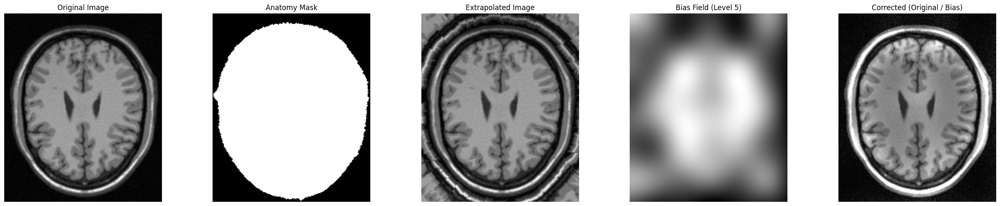

In [96]:
def run_cheng_extrapolation(image, wavelet='db16', max_levels=6, manual_level=None):
    """
    Runs Cheng extrapolation and displays original, mask, extrapolated, bias field, and corrected image.
    """
    result = cheng_extrapolation_correction(
        image, wavelet=wavelet, max_levels=max_levels
    )
    
    if result[0] is not None:
        _, _, optimal_level, mask, extrapolated, entropies = result
        
        bias_fields, _, _ = multiresolution_analysis_cheng(
            extrapolated, wavelet=wavelet, max_levels=max_levels
        )
        
        if manual_level is not None and 1 <= manual_level <= len(bias_fields):
            level = manual_level
        else:
            level = optimal_level
        
        bias_field = bias_fields[level - 1]
        
        # Show results in desired order
        corrected_rescaled = show_bias_correction_results(
            image, mask, extrapolated, bias_field, level
        )
        
        return corrected_rescaled, bias_field, level, mask, extrapolated
    else:
        print("Cheng extrapolation method failed")
        return None, None, None, None, None


def show_bias_correction_results(original, mask, extrapolated, bias_field, level=None):
    """
    Displays original, anatomy mask, extrapolated image, bias field, and corrected image.
    Returns the corrected image (rescaled).
    """
    safe_bias = np.clip(bias_field, 1e-4, None)
    corrected = original / safe_bias
    corrected_clipped = np.clip(corrected, 0, 2)
    corrected_rescaled = rescale_intensity(corrected_clipped, in_range='image', out_range=(0, 1))
    
    fig, axes = plt.subplots(1, 5, figsize=(25, 5))
    
    axes[0].imshow(original, cmap='gray')
    axes[0].set_title("Original Image")
    axes[0].axis('off')
    
    axes[1].imshow(mask, cmap='gray')
    axes[1].set_title("Anatomy Mask")
    axes[1].axis('off')
    
    axes[2].imshow(extrapolated, cmap='gray')
    axes[2].set_title("Extrapolated Image")
    axes[2].axis('off')
    
    axes[3].imshow(bias_field, cmap='gray')
    axes[3].set_title(f"Bias Field (Level {level})" if level else "Bias Field")
    axes[3].axis('off')
    
    axes[4].imshow(corrected_rescaled, cmap='gray')
    axes[4].set_title("Corrected (Original / Bias)")
    axes[4].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return corrected_rescaled

corrected, bias_field, level, mask, extrapolated = run_cheng_extrapolation(
    slice_2d, wavelet='db16', max_levels=6, manual_level=5
)


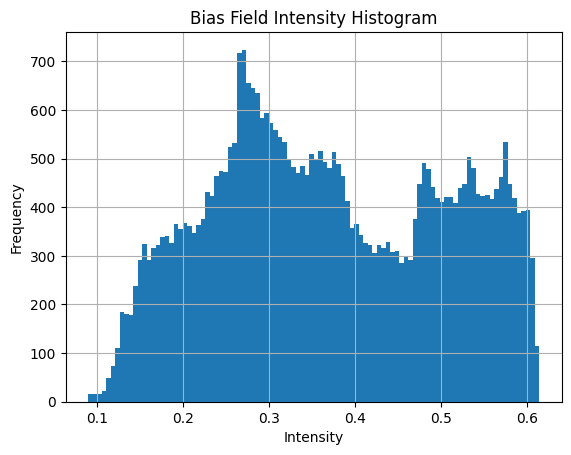

In [97]:
plt.hist(bias_field.ravel(), bins=100)
plt.title("Bias Field Intensity Histogram")
plt.xlabel("Intensity")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()


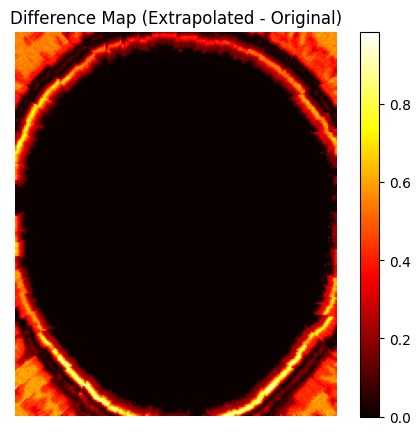

In [98]:
diff = np.abs(extrapolated - slice_2d)

plt.figure(figsize=(6, 5))
plt.imshow(diff, cmap='hot')
plt.title("Difference Map (Extrapolated - Original)")
plt.colorbar()
plt.axis('off')
plt.show()


### Visualising the results of Method 4(a) with a KMeans Mask 

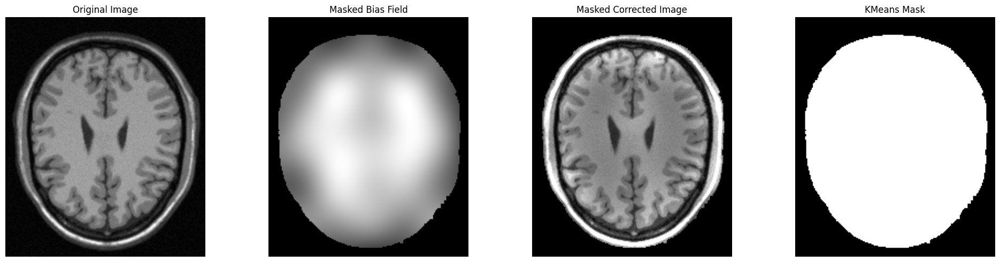

In [99]:
import matplotlib.pyplot as plt
from skimage.exposure import rescale_intensity
from scipy.ndimage import binary_fill_holes, binary_dilation

from sklearn.cluster import KMeans
import numpy as np

def create_kmeans_mask(image, n_clusters=2):
    # Flatten image for clustering
    flat = image.reshape(-1, 1)
    
    # Apply KMeans
    kmeans = KMeans(n_clusters=n_clusters, n_init='auto', random_state=42)
    kmeans.fit(flat)
    clustered = kmeans.labels_.reshape(image.shape)
    
    # Find cluster with highest mean intensity (assumed to be foreground)
    cluster_means = [np.mean(image[clustered == i]) for i in range(n_clusters)]
    brain_cluster = np.argmax(cluster_means)
    
    # Create binary mask
    mask = (clustered == brain_cluster)
    mask = binary_fill_holes(mask)
    mask = binary_dilation(mask, structure=np.ones((3, 3)))
  # Optional: smooth boundary
    return mask

def show_bias_correction_results(original, bias_field):
    # Step 1: Clip bias to avoid division explosion
    safe_bias = np.clip(bias_field, 1e-4, None)
    
    # Step 2: Correct the image
    corrected = original / safe_bias
    corrected_clipped = np.clip(corrected, 0, 2)
    corrected_rescaled = rescale_intensity(corrected_clipped, in_range='image', out_range=(0, 1))
    
    # Step 3: Create KMeans-based mask
    mask = create_kmeans_mask(original, n_clusters=2)

    # Step 4: Apply mask to bias and corrected image
    masked_bias = bias_field * mask
    masked_corrected = corrected_rescaled * mask

    # Step 5: Plotting
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    
    axes[0].imshow(original, cmap='gray')
    axes[0].set_title("Original Image")
    axes[0].axis('off')
    
    axes[1].imshow(masked_bias, cmap='gray')
    axes[1].set_title("Masked Bias Field")
    axes[1].axis('off')
    
    axes[2].imshow(masked_corrected, cmap='gray')
    axes[2].set_title("Masked Corrected Image")
    axes[2].axis('off')
    
    axes[3].imshow(mask, cmap='gray')
    axes[3].set_title("KMeans Mask")
    axes[3].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return masked_corrected

masked_corrected= show_bias_correction_results(slice_2d, bias_field)




### Method 4(b) : Nearest-Neighbor Extrapolation

=== Cheng et al. Extrapolation Method ===
Step 1: Finding image boundary...
Step 2: Extrapolating image by mirror reflection...
Step 3: Performing wavelet-based multi-resolution analysis...
Performing multi-resolution analysis...
Level 1: Entropy = 0.0624
Level 2: Entropy = 0.1703
Level 3: Entropy = 0.6541
Level 4: Entropy = 0.4794
Level 5: Entropy = 0.0284
Level 6: Entropy = 0.0691


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 4 is too high: all coefficients will experience boundary effects.
  warnings.warn(
C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 5 is too high: all coefficients will experience boundary effects.
  warnings.warn(
C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 6 is too high: all coefficients will experience boundary effects.
  warnings.warn(
C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 7 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 7: Entropy = 6.9786
Step 4: Optimal level selected: 5


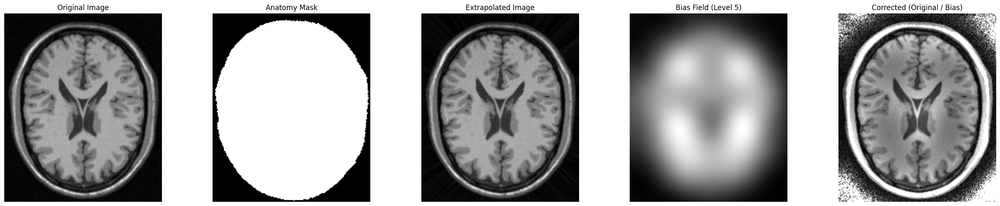

In [100]:
def load_mri_slice(nifti_file, slice_index=None):
    img = nib.load(nifti_file)
    data = img.get_fdata()
    if slice_index is None:
        slice_index = data.shape[0] // 2
    slice_2d = data[slice_index, :, :]
    slice_2d = rescale_intensity(slice_2d, in_range='image', out_range=(0, 1))
    return slice_2d, data


def find_image_boundary_cheng(image, noise_threshold_percentile=5):
    threshold = np.percentile(image, noise_threshold_percentile)
    binary_mask = image > threshold
    filled_mask = binary_fill_holes(binary_mask)
    cleaned_mask = binary_erosion(filled_mask, iterations=2)
    cleaned_mask = binary_dilation(cleaned_mask, iterations=3)
    cleaned_mask = binary_fill_holes(cleaned_mask)
    boundary = find_boundaries(cleaned_mask, mode='inner')
    return cleaned_mask, boundary


def extrapolate_image_cheng(image, mask):
    distance, nearest_indices = distance_transform_edt(~mask, return_indices=True)
    extrapolated = np.copy(image)
    outside_mask = ~mask.astype(bool)
    extrapolated[outside_mask] = image[tuple(nearest_indices[:, outside_mask])]
    return extrapolated


def calculate_image_entropy(image, bins=256):
    hist, _ = np.histogram(image.flatten(), bins=bins, density=True)
    hist = hist[hist > 0]
    return entropy(hist, base=2)


def multiresolution_analysis_cheng(image, wavelet='db16', max_levels=6):
    original_shape = image.shape
    new_rows = 2**int(np.ceil(np.log2(image.shape[0])))
    new_cols = 2**int(np.ceil(np.log2(image.shape[1])))
    
    if new_rows != image.shape[0] or new_cols != image.shape[1]:
        padded_image = np.zeros((new_rows, new_cols))
        padded_image[:image.shape[0], :image.shape[1]] = image
        image = padded_image

    bias_fields = []
    corrected_images = []
    entropies = []

    print("Performing multi-resolution analysis...")
    for level in range(1, max_levels + 1):
        try:
            coeffs = pywt.wavedec2(image, wavelet=wavelet, level=level)
            coeffs_approx = list(coeffs)
            for i in range(1, len(coeffs_approx)):
                coeffs_approx[i] = tuple(np.zeros_like(c) for c in coeffs_approx[i])
            bias_field = pywt.waverec2(coeffs_approx, wavelet=wavelet)

            if bias_field.shape != image.shape:
                bias_field = resize(bias_field, image.shape, preserve_range=True)

            if original_shape != image.shape:
                bias_field = bias_field[:original_shape[0], :original_shape[1]]
                original_image_cropped = image[:original_shape[0], :original_shape[1]]
            else:
                original_image_cropped = image

            bias_field = np.clip(bias_field, 1e-6, None)
            corrected = original_image_cropped / bias_field
            corrected = rescale_intensity(corrected, in_range='image', out_range=(0, 1))
            img_entropy = calculate_image_entropy(corrected)

            bias_fields.append(bias_field)
            corrected_images.append(corrected)
            entropies.append(img_entropy)

            print(f"Level {level}: Entropy = {img_entropy:.4f}")

        except Exception as e:
            print(f"Error at level {level}: {e}")
            continue

    return bias_fields, corrected_images, entropies


def cheng_extrapolation_correction(image, wavelet='db16', max_levels=6, noise_threshold_percentile=28):
    print("=== Cheng et al. Extrapolation Method ===")
    print("Step 1: Finding image boundary...")
    mask, _ = find_image_boundary_cheng(image, noise_threshold_percentile=noise_threshold_percentile)

    print("Step 2: Extrapolating image by mirror reflection...")
    extrapolated_image = extrapolate_image_cheng(image, mask)

    print("Step 3: Performing wavelet-based multi-resolution analysis...")
    bias_fields, corrected_images, entropies = multiresolution_analysis_cheng(
        extrapolated_image, wavelet=wavelet, max_levels=max_levels
    )

    if entropies:
        optimal_level = np.argmin(entropies)
        print(f"Step 4: Optimal level selected: {optimal_level + 1}")
        return (
            corrected_images[optimal_level],
            bias_fields[optimal_level],
            optimal_level + 1,
            mask,
            extrapolated_image,
            entropies
        )
    else:
        print("Error: No valid decomposition levels found")
        return None, None, None, mask, extrapolated_image, []


def show_bias_correction_results(original, mask, extrapolated, bias_field, level=None):
    safe_bias = np.clip(bias_field, 1e-4, None)
    corrected = original / safe_bias
    corrected_clipped = np.clip(corrected, 0, 2)
    corrected_rescaled = rescale_intensity(corrected_clipped, in_range='image', out_range=(0, 1))

    fig, axes = plt.subplots(1, 5, figsize=(25, 5))

    axes[0].imshow(original, cmap='gray')
    axes[0].set_title("Original Image")
    axes[0].axis('off')

    axes[1].imshow(mask, cmap='gray')
    axes[1].set_title("Anatomy Mask")
    axes[1].axis('off')

    axes[2].imshow(extrapolated, cmap='gray')
    axes[2].set_title("Extrapolated Image")
    axes[2].axis('off')

    axes[3].imshow(bias_field, cmap='gray')
    axes[3].set_title(f"Bias Field (Level {level})" if level else "Bias Field")
    axes[3].axis('off')

    axes[4].imshow(corrected_rescaled, cmap='gray')
    axes[4].set_title("Corrected (Original / Bias)")
    axes[4].axis('off')

    plt.tight_layout()
    plt.show()

    return corrected_rescaled


def run_cheng_extrapolation(image, wavelet='db16', max_levels=6):
    result = cheng_extrapolation_correction(
        image, wavelet=wavelet, max_levels=max_levels
    )

    if result[0] is not None:
        corrected, bias_field, level, mask, extrapolated, _ = result
        corrected_vis = show_bias_correction_results(image, mask, extrapolated, bias_field, level)
        return corrected_vis, bias_field, level, mask, extrapolated
    else:
        print("Cheng extrapolation method failed")
        return None, None, None, None, None


# === Example Usage ===
if __name__ == "__main__":
    nifti_file = r"C:\Users\anime\Downloads\SCIC_code\t1_icbm_normal_1mm_pn3_rf20.nii.gz"
    slice_2d, _ = load_mri_slice(nifti_file)
    corrected, bias_field, level, mask, extrapolated = run_cheng_extrapolation(
        slice_2d, wavelet='db16', max_levels=7
    )

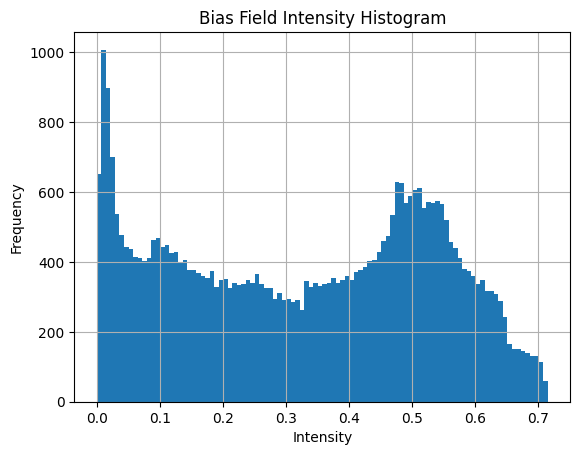

In [101]:
plt.hist(bias_field.ravel(), bins=100)
plt.title("Bias Field Intensity Histogram")
plt.xlabel("Intensity")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()


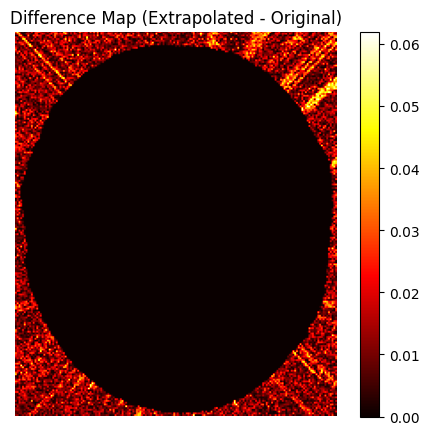

In [102]:
diff = np.abs(extrapolated - slice_2d)

plt.figure(figsize=(6, 5))
plt.imshow(diff, cmap='hot')
plt.title("Difference Map (Extrapolated - Original)")
plt.colorbar()
plt.axis('off')
plt.show()


### Visualizing the resultof Method 4(b) on a manual decomposition level

### Visulaising the results of Method 4(b) with an KMeans mask derived from the original slice

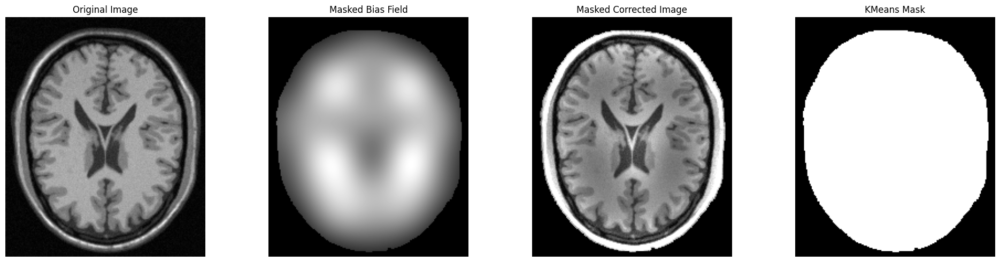

In [103]:
import matplotlib.pyplot as plt
from skimage.exposure import rescale_intensity
from scipy.ndimage import binary_fill_holes, binary_dilation

from sklearn.cluster import KMeans
import numpy as np

def create_kmeans_mask(image, n_clusters=2):
    # Flatten image for clustering
    flat = image.reshape(-1, 1)
    
    # Apply KMeans
    kmeans = KMeans(n_clusters=n_clusters, n_init='auto', random_state=42)
    kmeans.fit(flat)
    clustered = kmeans.labels_.reshape(image.shape)
    
    # Find cluster with highest mean intensity (assumed to be foreground)
    cluster_means = [np.mean(image[clustered == i]) for i in range(n_clusters)]
    brain_cluster = np.argmax(cluster_means)
    
    # Create binary mask
    mask = (clustered == brain_cluster)
    mask = binary_fill_holes(mask)
    mask = binary_dilation(mask, structure=np.ones((3, 3)))
  # Optional: smooth boundary
    return mask

def show_bias_correction_results(original, bias_field):
    # Step 1: Clip bias to avoid division explosion
    safe_bias = np.clip(bias_field, 1e-4, None)
    
    # Step 2: Correct the image
    corrected = original / safe_bias
    corrected_clipped = np.clip(corrected, 0, 2)
    corrected_rescaled = rescale_intensity(corrected_clipped, in_range='image', out_range=(0, 1))
    
    # Step 3: Create KMeans-based mask
    mask = create_kmeans_mask(original, n_clusters=2)

    # Step 4: Apply mask to bias and corrected image
    masked_bias = bias_field * mask
    masked_corrected = corrected_rescaled * mask

    # Step 5: Plotting
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    
    axes[0].imshow(original, cmap='gray')
    axes[0].set_title("Original Image")
    axes[0].axis('off')
    
    axes[1].imshow(masked_bias, cmap='gray')
    axes[1].set_title("Masked Bias Field")
    axes[1].axis('off')
    
    axes[2].imshow(masked_corrected, cmap='gray')
    axes[2].set_title("Masked Corrected Image")
    axes[2].axis('off')
    
    axes[3].imshow(mask, cmap='gray')
    axes[3].set_title("KMeans Mask")
    axes[3].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return masked_corrected

masked_corrected= show_bias_correction_results(slice_2d, bias_field)




### Visulaising the results of Method 4(b) with an Otsu mask derived from the original slice

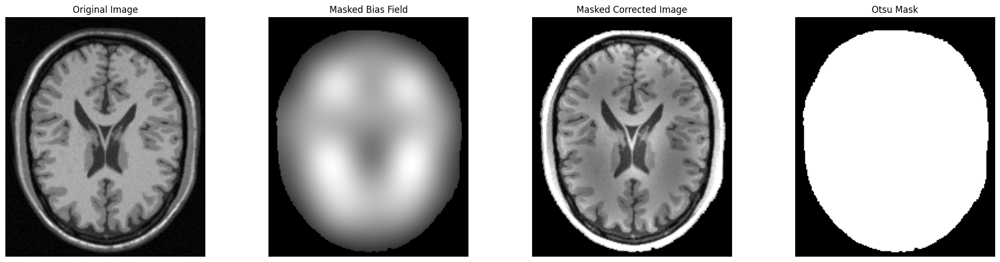

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [104]:
import matplotlib.pyplot as plt
from skimage.exposure import rescale_intensity
from skimage.filters import threshold_otsu
from scipy.ndimage import binary_fill_holes, binary_dilation
import numpy as np

def create_otsu_mask(image):
    # Step 1: Compute Otsu threshold
    thresh = threshold_otsu(image)
    
    # Step 2: Create mask (foreground = pixels above threshold)
    mask = image > thresh
        
    # Step 3: Fill holes and smooth edges
    mask = binary_fill_holes(mask)
    mask = binary_dilation(mask, structure=np.ones((3, 3)))
    return mask

def show_bias_correction_results(original, bias_field):
    # Step 1: Clip bias to avoid division explosion
    safe_bias = np.clip(bias_field, 1e-4, None)
    
    # Step 2: Correct the image
    corrected = original / safe_bias
    corrected_clipped = np.clip(corrected, 0, 2)
    corrected_rescaled = rescale_intensity(corrected_clipped, in_range='image', out_range=(0, 1))
    
    # Step 3: Create Otsu-based mask
    mask = create_otsu_mask(original)

    # Step 4: Apply mask to bias and corrected image
    masked_bias = bias_field * mask
    masked_corrected = corrected_rescaled * mask

    # Step 5: Plotting
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    
    axes[0].imshow(original, cmap='gray')
    axes[0].set_title("Original Image")
    axes[0].axis('off')
    
    axes[1].imshow(masked_bias, cmap='gray')
    axes[1].set_title("Masked Bias Field")
    axes[1].axis('off')
    
    axes[2].imshow(masked_corrected, cmap='gray')
    axes[2].set_title("Masked Corrected Image")
    axes[2].axis('off')
    
    axes[3].imshow(mask, cmap='gray')
    axes[3].set_title("Otsu Mask")
    axes[3].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return masked_corrected
show_bias_correction_results(slice_2d, bias_field)



### Visulaising the results of Method 4(b) on a manual decomposition level

=== Cheng et al. Extrapolation Method ===
Step 1: Finding image boundary...
Step 2: Extrapolating image by mirror reflection...
Step 3: Performing wavelet-based multi-resolution analysis...
Performing multi-resolution analysis...
Level 1: Entropy = 0.0624
Level 2: Entropy = 0.1703
Level 3: Entropy = 0.6541
Level 4: Entropy = 0.4794


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 4 is too high: all coefficients will experience boundary effects.
  warnings.warn(
C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 5 is too high: all coefficients will experience boundary effects.
  warnings.warn(
C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 6 is too high: all coefficients will experience boundary effects.
  warnings.warn(
C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 7 is too high: all coefficients will experience boundary effects.
  warnings.warn(
C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 8 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 5: Entropy = 0.0284
Level 6: Entropy = 0.0691
Level 7: Entropy = 6.9786
Level 8: Entropy = 6.9283
Step 4: Optimal level selected: 5
Performing multi-resolution analysis...
Level 1: Entropy = 0.0624
Level 2: Entropy = 0.1703
Level 3: Entropy = 0.6541
Level 4: Entropy = 0.4794
Level 5: Entropy = 0.0284
Level 6: Entropy = 0.0691
Level 7: Entropy = 6.9786
Level 8: Entropy = 6.9283


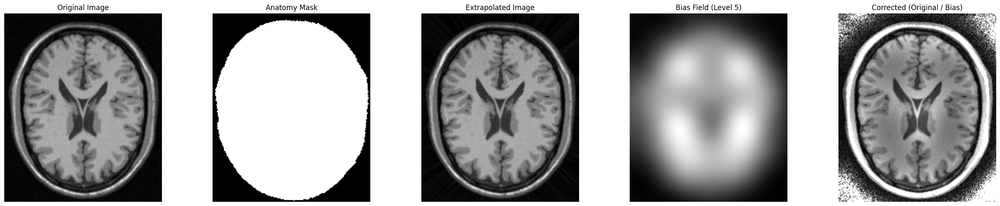

In [105]:
def run_cheng_extrapolation(image, wavelet='db16', max_levels=6, manual_level=None):
    """
    Main function to run the complete Cheng extrapolation algorithm.
    Uses division-based correction and displays:
    Original → Mask → Extrapolated → Bias Field → Corrected
    """
    result = cheng_extrapolation_correction(
        image, wavelet=wavelet, max_levels=max_levels
    )

    if result[0] is not None:
        _, _, optimal_level, mask, extrapolated, entropies = result

        bias_fields, _, _ = multiresolution_analysis_cheng(
            extrapolated, wavelet=wavelet, max_levels=max_levels
        )

        if manual_level is not None and 1 <= manual_level <= len(bias_fields):
            level = manual_level
        else:
            level = optimal_level

        bias_field = bias_fields[level - 1]

        # Compute corrected image as original / bias_field
        safe_bias = np.clip(bias_field, 1e-4, None)
        corrected = image / safe_bias
        corrected = np.clip(corrected, 0, 2)
        corrected = rescale_intensity(corrected, in_range='image', out_range=(0, 1))

        # Plot results
        fig, axes = plt.subplots(1, 5, figsize=(25, 5))

        axes[0].imshow(image, cmap='gray')
        axes[0].set_title("Original Image")
        axes[0].axis('off')

        axes[1].imshow(mask, cmap='gray')
        axes[1].set_title("Anatomy Mask")
        axes[1].axis('off')

        axes[2].imshow(extrapolated, cmap='gray')
        axes[2].set_title("Extrapolated Image")
        axes[2].axis('off')

        axes[3].imshow(bias_field, cmap='gray')
        axes[3].set_title(f"Bias Field (Level {level})")
        axes[3].axis('off')

        axes[4].imshow(corrected, cmap='gray')
        axes[4].set_title("Corrected (Original / Bias)")
        axes[4].axis('off')

        plt.tight_layout()
        plt.show()

        return corrected, bias_field, level, mask, extrapolated
    else:
        print("Cheng extrapolation method failed")
        return None, None, None, None, None
corrected, bias_field, level, mask, extrapolated = run_cheng_extrapolation(
    slice_2d, wavelet='db16', max_levels=8, manual_level=5
)


### **RECONSTRUCTION : SENSE-LIKE**

Data shape: (181, 217, 181)
Data type: float64


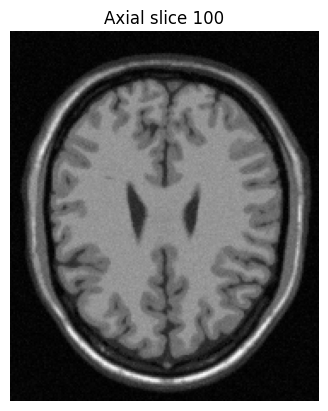

In [106]:
nifti_path = r't1_icbm_normal_1mm_pn3_rf0.mnc.gz'
img = nib.load(nifti_path)

# Get the image data as a NumPy array
data = img.get_fdata()

# Show basic info
print(f"Data shape: {data.shape}")
print(f"Data type: {data.dtype}")

# Display a central axial slice
slice_index = 100  
plt.imshow(data[slice_index, :, ], cmap='gray')
plt.title(f'Axial slice {slice_index}')
plt.axis('off')
plt.show()


The sensitivity map for coil *i* is defined as:

$$
S_i(x, y) = \exp\left( -\frac{(x - x_i)^2 + (y - y_i)^2}{2\sigma^2} \right)
$$

where:
- $ (x_i, y_i) $ is the center of the coil,
- $\sigma $   controls the spatial spread (i.e., how localized the sensitivity is).

Although, I have set the centre coordinates manually.


### Synthetically generated sensitivity profiles of 4 coils

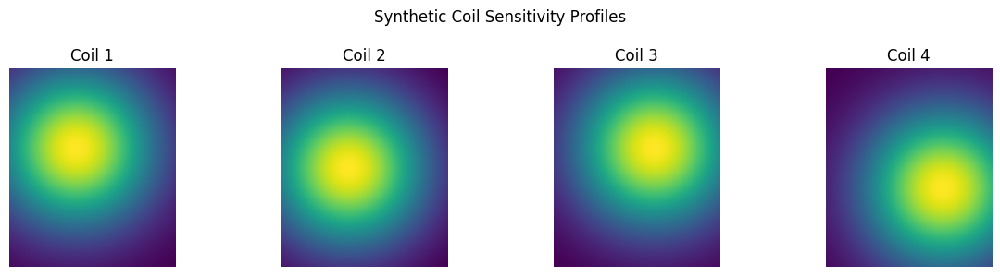

In [107]:
import numpy as np
import matplotlib.pyplot as plt

def generate_synthetic_sensitivities(shape, num_coils=4):
    h, w = shape
    y, x = np.mgrid[0:h, 0:w]
    sensitivities = []

    for i in range(num_coils):
        if i == 0:
            cx = w * 0.4  # shift right
            cy = h * 0.4  # shift up
        elif i == 2:
            cx = w*0.6
            cy = h*0.4
        elif i == 3:
            cx = w*0.7
            cy = h *0.6
        else:
            cx = w * (0.2 + 0.6 * i / (num_coils - 1))
            cy = h / 2
        
        sigma = w / 3

        sensitivity = np.exp(-((x - cx) ** 2 + (y - cy) ** 2) / (2 * sigma ** 2))
        sensitivities.append(sensitivity)

    return np.stack(sensitivities)




corrected_image = data[slice_index, :, :].astype(np.float32)
corrected_image /= np.max(corrected_image)  # normalize for display/simulation

num_coils = 4
sensitivities = generate_synthetic_sensitivities(corrected_image.shape, num_coils)

plt.figure(figsize=(12, 3))
for i in range(num_coils):
    plt.subplot(1, num_coils, i + 1)
    plt.imshow(sensitivities[i], cmap='viridis')
    plt.title(f'Coil {i+1}')
    plt.axis('off')

plt.suptitle("Synthetic Coil Sensitivity Profiles")
plt.tight_layout()
plt.show()


In [108]:
def simulate_coil_images(corrected_image, sensitivities):
    return sensitivities * corrected_image[np.newaxis, :, :]

coil_images = simulate_coil_images(corrected_image, sensitivities)


In [109]:
def undersample_kspace(coil_images, acceleration_factor=2):
    num_coils, h, w = coil_images.shape
    undersampled_images = np.zeros_like(coil_images, dtype=np.complex64)

    for i in range(num_coils):
        kspace = np.fft.fftshift(np.fft.fft2(coil_images[i]))
        mask = np.zeros_like(kspace)
        mask[::acceleration_factor, :] = 1  # Undersample in phase encode (rows)
        kspace_under = kspace * mask
        aliased_image = np.fft.ifft2(np.fft.ifftshift(kspace_under))
        undersampled_images[i] = aliased_image

    return undersampled_images


In [110]:
def visualize_undersampling(coil_images, undersampled_images, coil_idx=0):
    import matplotlib.pyplot as plt

    original = coil_images[coil_idx]
    aliased = undersampled_images[coil_idx]

    # Compute k-space for visualization
    kspace_full = np.log1p(np.abs(np.fft.fftshift(np.fft.fft2(original))))
    kspace_under = np.log1p(np.abs(np.fft.fftshift(np.fft.fft2(aliased))))

    plt.figure(figsize=(12, 6))

    plt.subplot(2, 3, 1)
    plt.title("Original Coil Image")
    plt.imshow(np.abs(original), cmap='gray')
    plt.axis('off')

    plt.subplot(2, 3, 2)
    plt.title("Full K-space (log)")
    plt.imshow(kspace_full, cmap='magma')
    plt.axis('off')

    plt.subplot(2, 3, 3)
    plt.title("Undersampled K-space (log)")
    plt.imshow(kspace_under, cmap='magma')
    plt.axis('off')

    plt.subplot(2, 3, 5)
    plt.title("Aliased Image")
    plt.imshow(np.abs(aliased), cmap='gray')
    plt.axis('off')

    plt.tight_layout()
    plt.show()


### Undersampling of scanned data

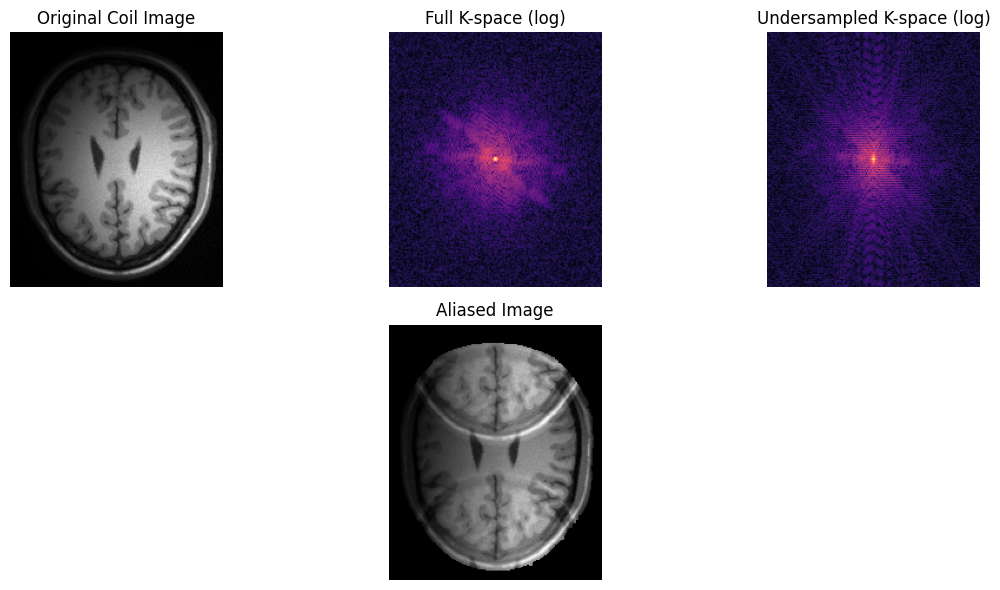

In [111]:
undersampled = undersample_kspace(coil_images, acceleration_factor=2)
if __name__ == "__main__":
    nifti_path = r"C:\Users\anime\Downloads\SCIC_code\t1_icbm_normal_1mm_pn3_rf20.nii.gz"
    brain_mask_path = r"C:\Users\anime\Downloads\SCIC_code\t1_brain_mask.nii.gz"
    slice_idx = 100

    original_slice, _ = load_mri_slice(nifti_path, slice_index=slice_idx)
mask = create_kmeans_mask(original_slice, n_clusters=2)

masked_undersampled = undersampled * mask[np.newaxis, :, :]  
visualize_undersampling(coil_images, masked_undersampled, coil_idx=3)


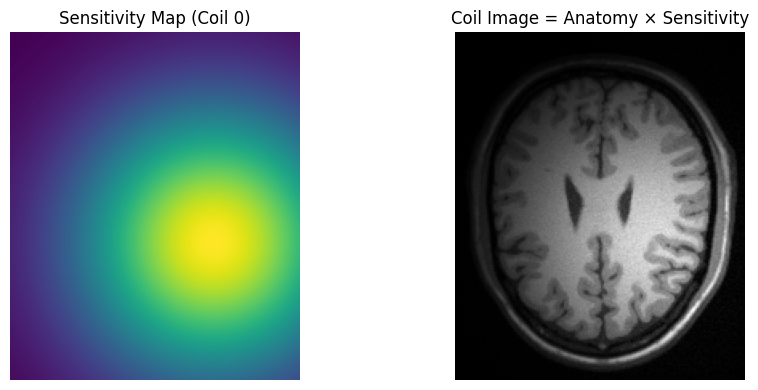

In [112]:
coil_idx = 3
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
plt.title("Sensitivity Map (Coil 0)")
plt.imshow(sensitivities[coil_idx], cmap='viridis')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Coil Image = Anatomy × Sensitivity")
plt.imshow(np.abs(coil_images[coil_idx]), cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()


### Syntethically Scanned Data With bias

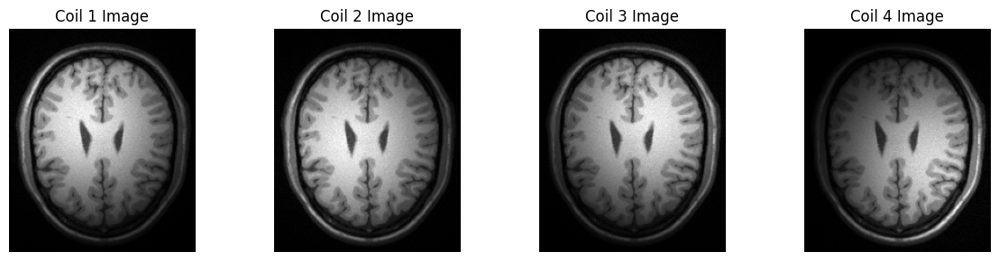

In [113]:
 plt.figure(figsize=(12, 3))
for i in range(num_coils):
    plt.subplot(1, num_coils, i + 1)
    plt.imshow(np.abs(coil_images[i]), cmap='gray')
    plt.title(f'Coil {i+1} Image')
    plt.axis('off')
plt.tight_layout()
plt.show()


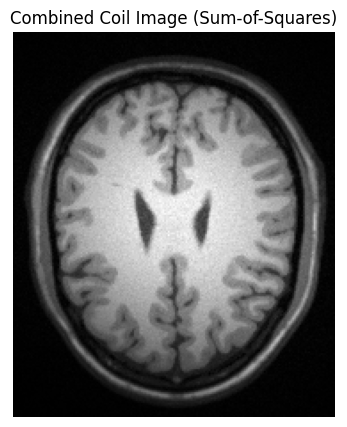

In [114]:
combined_image = np.sqrt(np.sum(np.abs(coil_images)**2, axis=0))

plt.figure(figsize=(6, 5))
plt.imshow(combined_image, cmap='gray')
plt.title('Combined Coil Image (Sum-of-Squares)')
plt.axis('off')
plt.show()


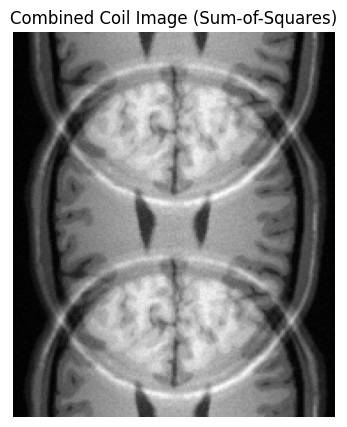

In [115]:
combined_image = np.sqrt(np.sum(np.abs(undersampled)**2, axis=0))

plt.figure(figsize=(6, 5))
plt.imshow(combined_image, cmap='gray')
plt.title('Combined Coil Image (Sum-of-Squares)')
plt.axis('off')
plt.show()

### Estimating the Sensitivity Profiles of all Coils

In [116]:
def load_mri_slice(nifti_file, slice_index=None):
    img = nib.load(nifti_file)
    data = img.get_fdata()
    if slice_index is None:
        slice_index = data.shape[0] // 2
    slice_2d = data[slice_index, :, :]
    slice_2d = rescale_intensity(slice_2d, in_range='image', out_range=(0, 1))
    return slice_2d, data

def dwt_approx(image, wavelet='bior4.4', level=1):
    coeffs = pywt.wavedec2(image, wavelet=wavelet, level=level)
    return coeffs

def calculate_wavelet_energy(coeffs):
    energy = 0
    for level_coeffs in coeffs[1:]:  # Exclude approximation coefficients
        for d in level_coeffs:
            energy += np.sum(d**2)
    return energy / (coeffs[0].size + 1e-6)  # Prevent division by zero

def iterative_mvp(image, wavelet='bior4.4', level=1, 
                 energy_threshold=0.05, max_iter=50):
    estimate = image.copy()
    initial_coeffs = dwt_approx(image, wavelet, level)
    initial_energy = calculate_wavelet_energy(initial_coeffs)
    
    for i in range(max_iter):
        coeffs = dwt_approx(estimate, wavelet, level)
        current_energy = calculate_wavelet_energy(coeffs)
        
        # Energy-based stopping criterion (Lin et al. Sec 2.2)
        if current_energy / initial_energy < energy_threshold:
            break
            
        # Original MVP processing (Lin et al. Fig 1)
        approx = coeffs[0]
        detail_coeffs = [tuple(np.zeros_like(d) for d in details) 
                        for details in coeffs[1:]]
        coeffs_zeroed = [approx] + detail_coeffs
        approx_up = pywt.waverec2(coeffs_zeroed, wavelet)
        approx_up = resize(approx_up, image.shape, 
                          preserve_range=True, mode='reflect',
                          anti_aliasing=True)
        approx_up = rescale_intensity(approx_up, in_range='image', 
                                     out_range=(0, 1))
        mvp = np.maximum(approx_up, image)
        estimate = mvp
        
    return estimate, initial_energy, current_energy, i+1

def normalize_image(original, bias_field):
    bias_field = np.clip(bias_field, 1e-3, None)
    return original / bias_field

def compute_inhomogeneity_index(image, coil_map):
    img = rescale_intensity(image, in_range='image', out_range=(0, 1))
    img_flat = img.flatten().reshape(-1, 1)
    
    gmm = GaussianMixture(n_components=3, random_state=42).fit(img_flat)
    means = gmm.means_.flatten()
    variances = gmm.covariances_.flatten()
    
    contrast = np.max(means) - np.min(means)
    variance = np.sum(variances)
    
    smoothness = np.sum(np.abs(laplace(coil_map)))
    
    return (variance / contrast) * smoothness

def correct_bias_field(image, wavelet='bior4.4', max_levels=7, 
                      base_energy_threshold=0.05):
    best_index = None
    best_score = np.inf
    best_corrected = None
    best_coil_map = None

    for level in range(1, max_levels + 1):
        energy_thresh = base_energy_threshold * (2 ** (level - 1))
        
        coil_map, init_e, final_e, iters = iterative_mvp(
            image, wavelet=wavelet, level=level, 
            energy_threshold=energy_thresh
        )
        corrected = normalize_image(image, coil_map)
        inhomogeneity = compute_inhomogeneity_index(corrected, coil_map)
        energy_ratio = final_e / init_e

        print(f"Level {level}: "
              f"Iterations={iters}, "
              f"Inhomogeneity={inhomogeneity:.4f}, "
              f"Energy Ratio={energy_ratio:.2%}")

        if inhomogeneity < best_score:
            best_score = inhomogeneity
            best_index = level
            best_corrected = corrected
            best_coil_map = coil_map

    return best_corrected, best_index, best_coil_map

def plot_correction_with_bias(original, corrected, bias_field, level, mask=None):
    plt.figure(figsize=(24, 6))

    plt.subplot(1, 4, 1)
    plt.title("Original Slice")
    plt.imshow(original, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 4, 2)
    plt.title(f"Corrected (Level {level})")
    plt.imshow(corrected, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 4, 3)
    plt.title("Bias Field (Grayscale)")
    plt.imshow(bias_field, cmap='gray')
    plt.colorbar(shrink=0.7)
    plt.axis('off')

    plt.subplot(1, 4, 4)
    plt.title("Bias Field (Heatmap)")
    plt.imshow(bias_field, cmap='jet')
    plt.colorbar(shrink=0.7)
    plt.axis('off')

    plt.tight_layout()
    plt.show()



In [117]:
def create_kmeans_mask(image, n_clusters=2):
    # Flatten image for clustering
    flat = image.reshape(-1, 1)
    
    # Apply KMeans
    kmeans = KMeans(n_clusters=n_clusters, n_init='auto', random_state=42)
    kmeans.fit(flat)
    clustered = kmeans.labels_.reshape(image.shape)
    
    # Find cluster with highest mean intensity (assumed to be foreground)
    cluster_means = [np.mean(image[clustered == i]) for i in range(n_clusters)]
    brain_cluster = np.argmax(cluster_means)
    
    # Create binary mask
    mask = (clustered == brain_cluster)
    mask = binary_fill_holes(mask)
    mask = binary_dilation(mask, structure=np.ones((3, 3)))
  # Optional: smooth boundary
    return mask



In [118]:
from skimage.filters import threshold_otsu
def create_otsu_mask(image):
    # Step 1: Compute Otsu threshold
    thresh = threshold_otsu(image)
    
    # Step 2: Create mask (foreground = pixels above threshold)
    mask = image > thresh
    
    # Step 3: Fill holes and smooth edges
    mask = binary_fill_holes(mask)
    mask = binary_dilation(mask, structure=np.ones((3, 3)))
    return mask

Level 1: Iterations=50, Inhomogeneity=27.4682, Energy Ratio=10.33%
Level 2: Iterations=50, Inhomogeneity=62.1776, Energy Ratio=46.84%
Level 3: Iterations=2, Inhomogeneity=10.3999, Energy Ratio=5.00%
Level 4: Iterations=2, Inhomogeneity=4.5898, Energy Ratio=4.72%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 5 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 5: Iterations=2, Inhomogeneity=4.0922, Energy Ratio=7.97%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 6 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 6: Iterations=2, Inhomogeneity=13.6481, Energy Ratio=30.62%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 7 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 7: Iterations=5, Inhomogeneity=11.3942, Energy Ratio=78.56%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 8 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 8: Iterations=1, Inhomogeneity=90.3122, Energy Ratio=100.00%
Level 9: Iterations=1, Inhomogeneity=90.3122, Energy Ratio=100.00%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 9 is too high: all coefficients will experience boundary effects.
  warnings.warn(
C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 10 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 10: Iterations=1, Inhomogeneity=90.3122, Energy Ratio=100.00%


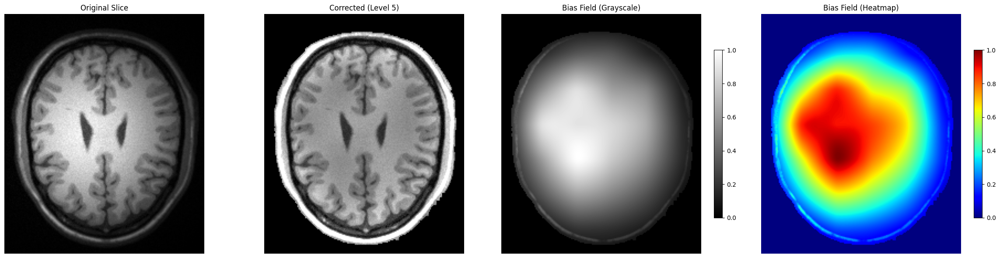

In [119]:
corrected_img, best_level, bias_field = correct_bias_field(
        coil_images[1], 
        wavelet='bior4.4',
        max_levels=10,
        base_energy_threshold=0.015
    )

if __name__ == "__main__":
    nifti_path = r"C:\Users\anime\Downloads\SCIC_code\t1_icbm_normal_1mm_pn3_rf20.nii.gz"
    brain_mask_path = r"C:\Users\anime\Downloads\SCIC_code\t1_brain_mask.nii.gz"
    slice_idx = 100

    original_slice, _ = load_mri_slice(nifti_path, slice_index=slice_idx)
mask = create_kmeans_mask(original_slice, n_clusters=2)

masked_corrected = corrected_img * mask
masked_bias_1 = bias_field * mask

    
plot_correction_with_bias(coil_images[1], masked_corrected, 
                             masked_bias_1, best_level)


Level 1: Iterations=50, Inhomogeneity=22.0420, Energy Ratio=18.38%
Level 2: Iterations=50, Inhomogeneity=17.0180, Energy Ratio=17.91%
Level 3: Iterations=18, Inhomogeneity=16.5205, Energy Ratio=5.85%
Level 4: Iterations=2, Inhomogeneity=28.7557, Energy Ratio=9.37%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 5 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 5: Iterations=2, Inhomogeneity=4.8835, Energy Ratio=14.94%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 6 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 6: Iterations=50, Inhomogeneity=6.2402, Energy Ratio=80.45%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 7 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 7: Iterations=5, Inhomogeneity=0.3132, Energy Ratio=81.30%
Level 8: Iterations=1, Inhomogeneity=85.3632, Energy Ratio=100.00%
Level 9: Iterations=1, Inhomogeneity=85.3632, Energy Ratio=100.00%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 8 is too high: all coefficients will experience boundary effects.
  warnings.warn(
C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 9 is too high: all coefficients will experience boundary effects.
  warnings.warn(
C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 10 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 10: Iterations=1, Inhomogeneity=85.3632, Energy Ratio=100.00%


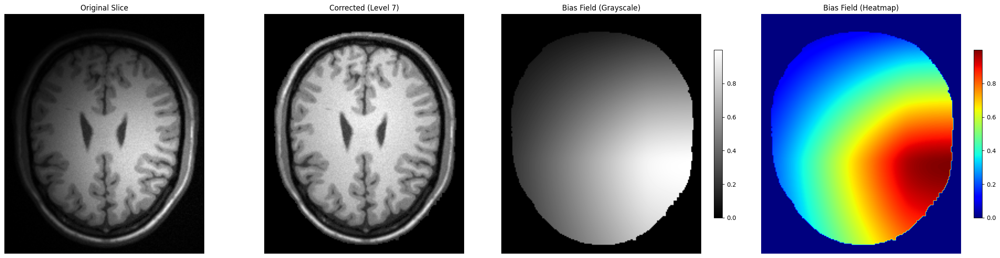

In [120]:
corrected_img, best_level, bias_field = correct_bias_field(
        coil_images[3], 
        wavelet='bior4.4',
        max_levels=10,
        base_energy_threshold=0.015
    )

if __name__ == "__main__":
    nifti_path = r"C:\Users\anime\Downloads\SCIC_code\t1_icbm_normal_1mm_pn3_rf20.nii.gz"
    brain_mask_path = r"C:\Users\anime\Downloads\SCIC_code\t1_brain_mask.nii.gz"
    slice_idx = 100

    original_slice, _ = load_mri_slice(nifti_path, slice_index=slice_idx)
mask = create_kmeans_mask(original_slice, n_clusters=2)

masked_corrected = corrected_img * mask
masked_bias_3 = bias_field * mask

    
plot_correction_with_bias(coil_images[3], masked_corrected, 
                             masked_bias_3, best_level)


Level 1: Iterations=50, Inhomogeneity=26.5056, Energy Ratio=12.71%
Level 2: Iterations=50, Inhomogeneity=50.1120, Energy Ratio=45.64%
Level 3: Iterations=5, Inhomogeneity=8.3305, Energy Ratio=5.41%
Level 4: Iterations=2, Inhomogeneity=4.2153, Energy Ratio=5.91%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 5 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 5: Iterations=2, Inhomogeneity=3.8157, Energy Ratio=8.54%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 6 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 6: Iterations=3, Inhomogeneity=1.1783, Energy Ratio=42.08%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 7 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 7: Iterations=5, Inhomogeneity=8.1640, Energy Ratio=83.20%
Level 8: Iterations=1, Inhomogeneity=87.6545, Energy Ratio=100.00%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 8 is too high: all coefficients will experience boundary effects.
  warnings.warn(
C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 9 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 9: Iterations=1, Inhomogeneity=87.6545, Energy Ratio=100.00%
Level 10: Iterations=1, Inhomogeneity=87.6545, Energy Ratio=100.00%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 10 is too high: all coefficients will experience boundary effects.
  warnings.warn(


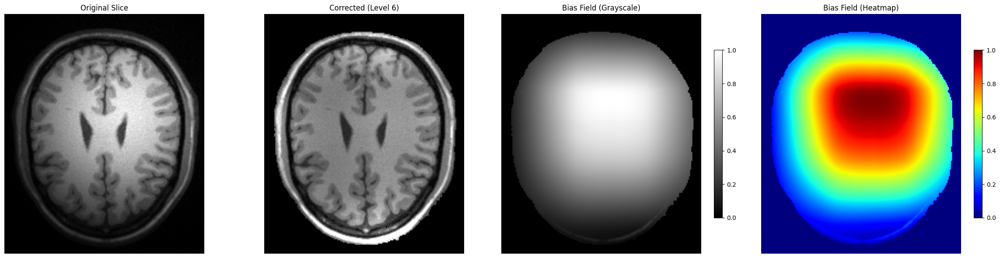

In [121]:
corrected_img, best_level, bias_field = correct_bias_field(
        coil_images[2], 
        wavelet='bior4.4',
        max_levels=10,
        base_energy_threshold=0.015
    )

if __name__ == "__main__":
    nifti_path = r"C:\Users\anime\Downloads\SCIC_code\t1_icbm_normal_1mm_pn3_rf20.nii.gz"
    brain_mask_path = r"C:\Users\anime\Downloads\SCIC_code\t1_brain_mask.nii.gz"
    slice_idx = 100

    original_slice, _ = load_mri_slice(nifti_path, slice_index=slice_idx)
mask = create_kmeans_mask(original_slice, n_clusters=2)

masked_corrected = corrected_img * mask
masked_bias_2 = bias_field * mask

    
plot_correction_with_bias(coil_images[2], masked_corrected, 
                             masked_bias_2, best_level)


Level 1: Iterations=50, Inhomogeneity=27.3216, Energy Ratio=9.41%
Level 2: Iterations=50, Inhomogeneity=75.6145, Energy Ratio=60.35%
Level 3: Iterations=2, Inhomogeneity=8.4891, Energy Ratio=3.96%
Level 4: Iterations=2, Inhomogeneity=3.9559, Energy Ratio=4.20%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 5 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 5: Iterations=2, Inhomogeneity=3.8235, Energy Ratio=6.74%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 6 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 6: Iterations=2, Inhomogeneity=3.5398, Energy Ratio=23.78%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 7 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 7: Iterations=5, Inhomogeneity=13.3083, Energy Ratio=91.76%
Level 8: Iterations=1, Inhomogeneity=93.6056, Energy Ratio=100.00%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 8 is too high: all coefficients will experience boundary effects.
  warnings.warn(
C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 9 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 9: Iterations=1, Inhomogeneity=93.6056, Energy Ratio=100.00%
Level 10: Iterations=1, Inhomogeneity=93.6056, Energy Ratio=100.00%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 10 is too high: all coefficients will experience boundary effects.
  warnings.warn(


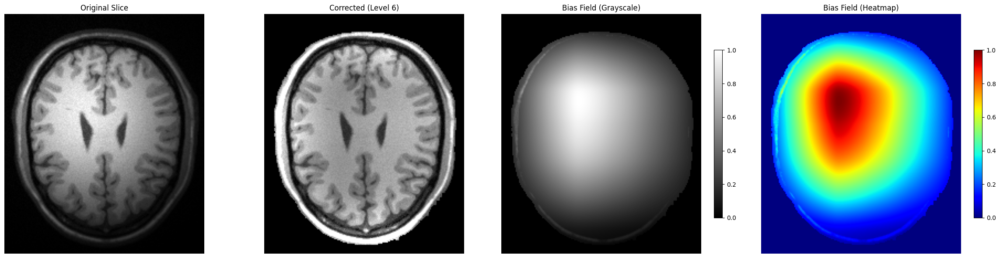

In [122]:
corrected_img, best_level, bias_field = correct_bias_field(
        coil_images[0], 
        wavelet='bior4.4',
        max_levels=10,
        base_energy_threshold=0.015
    )

if __name__ == "__main__":
    nifti_path = r"C:\Users\anime\Downloads\SCIC_code\t1_icbm_normal_1mm_pn3_rf20.nii.gz"
    brain_mask_path = r"C:\Users\anime\Downloads\SCIC_code\t1_brain_mask.nii.gz"
    slice_idx = 100

    original_slice, _ = load_mri_slice(nifti_path, slice_index=slice_idx)
mask = create_kmeans_mask(original_slice, n_clusters=2)

masked_corrected = corrected_img * mask
masked_bias_0 = bias_field * mask

    
plot_correction_with_bias(coil_images[0], masked_corrected, 
                             masked_bias_0, best_level)


In [123]:
def create_kmeans_mask(image, n_clusters=2):
    # Flatten image for clustering
    flat = image.reshape(-1, 1)
    
    # Apply KMeans
    kmeans = KMeans(n_clusters=n_clusters, n_init='auto', random_state=42)
    kmeans.fit(flat)
    clustered = kmeans.labels_.reshape(image.shape)
    
    # Find cluster with highest mean intensity (assumed to be foreground)
    cluster_means = [np.mean(image[clustered == i]) for i in range(n_clusters)]
    brain_cluster = np.argmax(cluster_means)
    
    # Create binary mask
    mask = (clustered == brain_cluster)
    mask = binary_fill_holes(mask)
    mask = binary_dilation(mask, structure=np.ones((3, 3)))
  # Optional: smooth boundary
    return mask



In [124]:
estimated_sensitivities = []

for i in range(num_coils):
    _, _, est_bias = correct_bias_field(coil_images[i], wavelet='bior4.4',
                                        max_levels=10, base_energy_threshold=0.015)
    estimated_sensitivities.append(est_bias)

estimated_sensitivities = np.stack(estimated_sensitivities)  # Shape: (num_coils, H, W)
from scipy.ndimage import gaussian_filter

smoothed_sensitivities = np.zeros_like(estimated_sensitivities)
for i in range(num_coils):
    smoothed_sensitivities[i] = gaussian_filter(estimated_sensitivities[i], sigma=3)

# Then normalize
rss = np.sqrt(np.sum(np.abs(smoothed_sensitivities)**2, axis=0))
normalized_sensitivities = smoothed_sensitivities / (rss + 1e-6)[None, :, :]



Level 1: Iterations=50, Inhomogeneity=27.3216, Energy Ratio=9.41%
Level 2: Iterations=50, Inhomogeneity=75.6145, Energy Ratio=60.35%
Level 3: Iterations=2, Inhomogeneity=8.4891, Energy Ratio=3.96%
Level 4: Iterations=2, Inhomogeneity=3.9559, Energy Ratio=4.20%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 5 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 5: Iterations=2, Inhomogeneity=3.8235, Energy Ratio=6.74%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 6 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 6: Iterations=2, Inhomogeneity=3.5398, Energy Ratio=23.78%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 7 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 7: Iterations=5, Inhomogeneity=13.3083, Energy Ratio=91.76%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 8 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 8: Iterations=1, Inhomogeneity=93.6056, Energy Ratio=100.00%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 9 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 9: Iterations=1, Inhomogeneity=93.6056, Energy Ratio=100.00%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 10 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 10: Iterations=1, Inhomogeneity=93.6056, Energy Ratio=100.00%
Level 1: Iterations=50, Inhomogeneity=27.4682, Energy Ratio=10.33%
Level 2: Iterations=50, Inhomogeneity=62.1776, Energy Ratio=46.84%
Level 3: Iterations=2, Inhomogeneity=10.3999, Energy Ratio=5.00%
Level 4: Iterations=2, Inhomogeneity=4.5898, Energy Ratio=4.72%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 5 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 5: Iterations=2, Inhomogeneity=4.0922, Energy Ratio=7.97%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 6 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 6: Iterations=2, Inhomogeneity=13.6481, Energy Ratio=30.62%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 7 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 7: Iterations=5, Inhomogeneity=11.3942, Energy Ratio=78.56%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 8 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 8: Iterations=1, Inhomogeneity=90.3122, Energy Ratio=100.00%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 9 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 9: Iterations=1, Inhomogeneity=90.3122, Energy Ratio=100.00%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 10 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 10: Iterations=1, Inhomogeneity=90.3122, Energy Ratio=100.00%
Level 1: Iterations=50, Inhomogeneity=26.5056, Energy Ratio=12.71%
Level 2: Iterations=50, Inhomogeneity=50.1120, Energy Ratio=45.64%
Level 3: Iterations=5, Inhomogeneity=8.3305, Energy Ratio=5.41%
Level 4: Iterations=2, Inhomogeneity=4.2153, Energy Ratio=5.91%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 5 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 5: Iterations=2, Inhomogeneity=3.8157, Energy Ratio=8.54%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 6 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 6: Iterations=3, Inhomogeneity=1.1783, Energy Ratio=42.08%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 7 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 7: Iterations=5, Inhomogeneity=8.1640, Energy Ratio=83.20%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 8 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 8: Iterations=1, Inhomogeneity=87.6545, Energy Ratio=100.00%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 9 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 9: Iterations=1, Inhomogeneity=87.6545, Energy Ratio=100.00%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 10 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 10: Iterations=1, Inhomogeneity=87.6545, Energy Ratio=100.00%
Level 1: Iterations=50, Inhomogeneity=22.0420, Energy Ratio=18.38%
Level 2: Iterations=50, Inhomogeneity=17.0180, Energy Ratio=17.91%
Level 3: Iterations=18, Inhomogeneity=16.5205, Energy Ratio=5.85%
Level 4: Iterations=2, Inhomogeneity=28.7557, Energy Ratio=9.37%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 5 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 5: Iterations=2, Inhomogeneity=4.8835, Energy Ratio=14.94%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 6 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 6: Iterations=50, Inhomogeneity=6.2402, Energy Ratio=80.45%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 7 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 7: Iterations=5, Inhomogeneity=0.3132, Energy Ratio=81.30%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 8 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 8: Iterations=1, Inhomogeneity=85.3632, Energy Ratio=100.00%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 9 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 9: Iterations=1, Inhomogeneity=85.3632, Energy Ratio=100.00%


C:\Users\anime\AppData\Roaming\Python\Python311\site-packages\pywt\_multilevel.py:43: UserWarning: Level value of 10 is too high: all coefficients will experience boundary effects.
  warnings.warn(


Level 10: Iterations=1, Inhomogeneity=85.3632, Energy Ratio=100.00%


## Estimated Sensitivity Maps

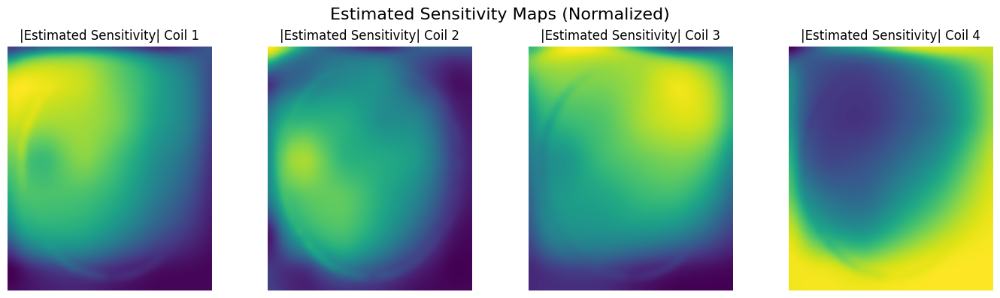

In [125]:
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(14, 4))
for i in range(num_coils):
    plt.subplot(1, num_coils, i + 1)
    plt.imshow(np.abs(normalized_sensitivities[i]), cmap='viridis')
    plt.title(f'|Estimated Sensitivity| Coil {i+1}')
    plt.axis('off')

plt.suptitle("Estimated Sensitivity Maps (Normalized)", fontsize=16)
plt.tight_layout()
plt.show()


### SENSE Reconstruction

In [126]:
acceleration_factor = 2  # or whatever R you used
num_coils, H, W = normalized_sensitivities.shape
H_alias = H // acceleration_factor

# Output: reconstructed full-FOV image
reconstructed = np.zeros((H, W), dtype=np.complex64)

for x in range(W):
    for y_alias in range(H_alias):
        # Actual y-positions that folded into this alias row
        y_indices = [y_alias + r * H_alias for r in range(acceleration_factor)]
        y_indices = [y for y in y_indices if y < H]  # bounds check

        # Observed aliased pixel across coils at (y_alias, x)
        aliased_vector = undersampled[:, y_alias, x]  # shape: (num_coils,)

        # Sensitivity matrix C: shape (num_coils, R)
        C_matrix = np.array([
            normalized_sensitivities[:, y, x] for y in y_indices
        ]).T  # shape: (num_coils, R)

        if C_matrix.shape[1] != len(y_indices):
            continue  # Skip if mismatch

        try:
            # Moore-Penrose pseudoinverse unfolding
            unfolded_pixels = np.linalg.pinv(C_matrix) @ aliased_vector  # (R,)
            for i, y_true in enumerate(y_indices):
                reconstructed[y_true, x] = unfolded_pixels[i]
        except np.linalg.LinAlgError:
            continue  # Skip if ill-conditioned


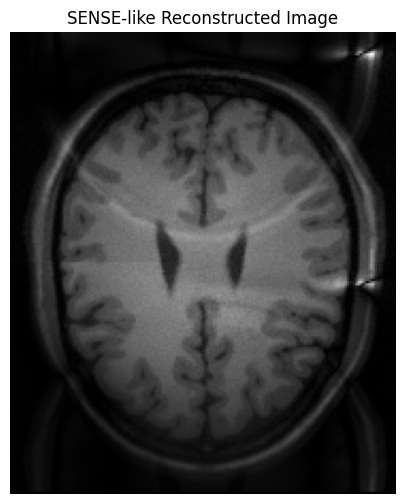

In [127]:
plt.figure(figsize=(6, 6))
plt.imshow(np.abs(reconstructed), cmap='gray')
plt.title("SENSE-like Reconstructed Image")
plt.axis('off')
plt.show()


### SENSE Reconstruction with Tikohonov Regularization

In [128]:
acceleration_factor = 2  # or whatever R you used
num_coils, H, W = normalized_sensitivities.shape
H_alias = H // acceleration_factor

# Output: reconstructed full-FOV image
reconstructed = np.zeros((H, W), dtype=np.complex64)
def tikhonov_inverse(C, lam=1e-3):
    CHC = C.conj().T @ C
    return np.linalg.inv(CHC + lam * np.eye(CHC.shape[0])) @ C.conj().T


for x in range(W):
    for y_alias in range(H_alias):
        # Actual y-positions that folded into this alias row
        y_indices = [y_alias + r * H_alias for r in range(acceleration_factor)]
        y_indices = [y for y in y_indices if y < H]  # bounds check

        # Observed aliased pixel across coils at (y_alias, x)
        aliased_vector = undersampled[:, y_alias, x]  # shape: (num_coils,)

        # Sensitivity matrix C: shape (num_coils, R)
        C_matrix = np.array([
            normalized_sensitivities[:, y, x] for y in y_indices
        ]).T  # shape: (num_coils, R)

        if C_matrix.shape[1] != len(y_indices):
            continue  # Skip if mismatch

        try:
            # Moore-Penrose pseudoinverse unfolding
            unfolded_pixels = tikhonov_inverse(C_matrix) @ aliased_vector  # (R,)
            for i, y_true in enumerate(y_indices):
                reconstructed[y_true, x] = unfolded_pixels[i]
        except np.linalg.LinAlgError:
            continue  # Skip if ill-conditioned


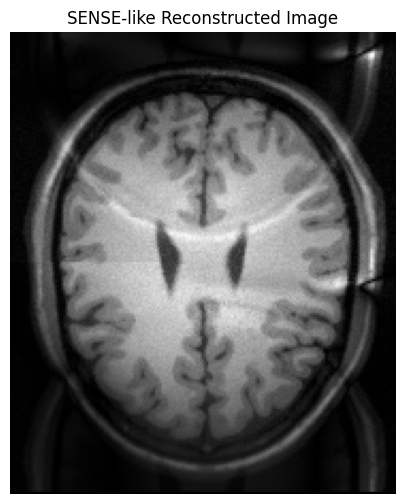

In [129]:
plt.figure(figsize=(6, 6))
plt.imshow(np.abs(reconstructed), cmap='gray')
plt.title("SENSE-like Reconstructed Image")
plt.axis('off')
plt.show()


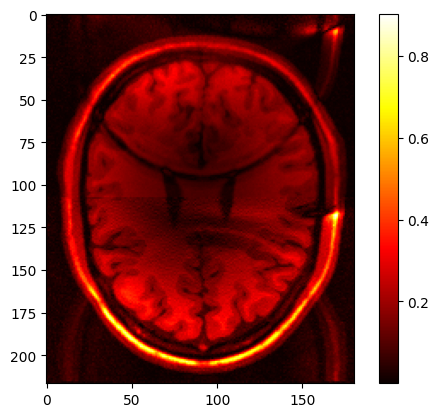

In [130]:
alias_residual = np.abs(reconstructed - corrected_image)
plt.imshow(alias_residual, cmap='hot'); plt.colorbar()
